In [1]:
import os 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb

def case_preprocessing():
    dataset = list()
    only_train_dataset = list()
    df = pd.DataFrame()
    train_df = pd.DataFrame()   # 새로운 Col 만들기 
    dir_path = 'C:\\Users\\gusrl\\opendrift\\drift_trajection'
    pastDir_path = 'C:\\Users\\gusrl\\opendrift\\drift_trajection\\Past_data'
    
    # hour, wind(바람의 x축,y축 방향 각각 제곱합의 루트), water(해류의 x축,y축 방향 각각 제곱합의 루트)
    for k in range(1,16):
        only_train_dataset.append(pd.read_csv(os.path.join(pastDir_path ,(str(k)+'.csv'))))
                                  
    # 2016 (case 7) (동해)
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_003.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_005.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_010.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_011.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_015.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_016.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_040.csv')))

    # 2018(case 12) (서해)
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_005.csv')))
    # dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_008.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_017.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_027.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_032.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_034.csv')))
    # dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_045.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_047.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_082.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_083.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_090.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_095.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_097.csv')))

    # 2019(case 4) (남해)
    dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_000.csv')))
#     dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_001.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_006.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_007.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_005.csv')))
    
    # 과거데이터 전처리 
    for i in range(len(only_train_dataset)):
        # 동해 서해 남해 
        if i <8:
            only_train_dataset[i]['E'] = 0
            only_train_dataset[i]['W'] = 0
            only_train_dataset[i]['S'] = 1
        else:
            only_train_dataset[i]['E'] = 0
            only_train_dataset[i]['W'] = 1
            only_train_dataset[i]['S'] = 0
        
        # 시간처리를 위해 time의 object type -> datetime64로 변경
        only_train_dataset[i]['time'] = pd.to_datetime(only_train_dataset[i]['time'],format = '%Y-%m-%d %H:%M', errors = 'raise')
        # hour열 생성
        only_train_dataset[i]['hour'] = only_train_dataset[i]['time'].dt.hour
        # wind 열 생성
        only_train_dataset[i]['wind'] = (only_train_dataset[i]['wind_x']**2 + only_train_dataset[i]['wind_y']**2)**(1/2)
        # water열 생성
        only_train_dataset[i]['water'] = (only_train_dataset[i]['water_velocity_x']**2 + only_train_dataset[i]['water_velocity_y']**2)**(1/2)
        # diff_lon열 생성
        only_train_dataset[i]['diff_lon'] = only_train_dataset[i]['obs_x1_lon'].diff() 
        only_train_dataset[i]['diff_lon'][0] = 0
        # diff_lat열 생성
        only_train_dataset[i]['diff_lat'] = only_train_dataset[i]['obs_x1_lat'].diff()
        only_train_dataset[i]['diff_lat'][0] = 0
        # 'diff_wind_x'열 생성
        only_train_dataset[i]['diff_wind_x'] = only_train_dataset[i]['wind_x'].diff() 
        only_train_dataset[i]['diff_wind_x'][0] = 0
        # 'diff_wind_y'열 생성
        only_train_dataset[i]['diff_wind_y'] = only_train_dataset[i]['wind_y'].diff()
        only_train_dataset[i]['diff_wind_y'][0] = 0
        # 'diff_wind_x'열 생성
        only_train_dataset[i]['diff_water_velocity_x'] = only_train_dataset[i]['water_velocity_x'].diff() 
        only_train_dataset[i]['diff_water_velocity_x'][0] = 0
        # 'diff_wind_y'열 생성
        only_train_dataset[i]['diff_water_velocity_y'] = only_train_dataset[i]['water_velocity_y'].diff() 
        only_train_dataset[i]['diff_water_velocity_y'][0] = 0
        # 초기 이동 고려 (원-핫 인코딩)
        only_train_dataset[i]['initial'] = 0
        only_train_dataset[i]['not_initial'] = 0
        for j in range(0,10):
            only_train_dataset[i]['not_initial'][j] = 0
            only_train_dataset[i]['initial'][j] = 1
        
        # model_x2_lon
        # diff_lon열 생성
        only_train_dataset[i]['diff_mod_lon'] = only_train_dataset[i]['model_x2_lon'].diff() 
        only_train_dataset[i]['diff_mod_lon'][0] = 0
        # diff_lat열 생성
        only_train_dataset[i]['diff_mod_lat'] = only_train_dataset[i]['model_x2_lat'].diff()
        only_train_dataset[i]['diff_mod_lat'][0] = 0
        
        only_train_dataset[i]['water_velocity_x_10'] = only_train_dataset[i]['water_velocity_x'] * 10
        only_train_dataset[i]['water_velocity_y_10'] = only_train_dataset[i]['water_velocity_y'] * 10
        
        # diff열 생성
        only_train_dataset[i]['diff'] = (only_train_dataset[i]['diff_lon']**2 + only_train_dataset[i]['diff_lat']**2)**(1/2)
        
        # Null 값 제외
        
        only_train_dataset[i] = only_train_dataset[i].dropna()
        only_train_dataset[i] = only_train_dataset[i].reset_index(drop = True)
        
        
        # 초기좌표 (해역 나누기)
        only_train_dataset[i]['start_lon'] = only_train_dataset[i]['obs_x1_lon'][0]
        only_train_dataset[i]['start_lat'] = only_train_dataset[i]['obs_x1_lat'][0]
        
        # Smoothing (wind_x_ma, wind_y_ma, water_velocity_x_ma, water_velocity_y_ma 인자 추가) 
        only_train_dataset[i]['wind_x_ma'] = 0
        only_train_dataset[i]['wind_y_ma'] = 0
        only_train_dataset[i]['water_velocity_x_ma'] = 0
        only_train_dataset[i]['water_velocity_y_ma'] = 0 
        for j in range(1,len(only_train_dataset[i])-1):
            only_train_dataset[i]['wind_x_ma'][j] = (only_train_dataset[i]['wind_x'][j-1] + only_train_dataset[i]['wind_x'][j] + only_train_dataset[i]['wind_x'][j+1])/3
            only_train_dataset[i]['wind_y_ma'][j] = (only_train_dataset[i]['wind_y'][j-1] + only_train_dataset[i]['wind_y'][j] + only_train_dataset[i]['wind_y'][j+1])/3
            only_train_dataset[i]['water_velocity_x_ma'][j] = (only_train_dataset[i]['water_velocity_x'][j-1] + only_train_dataset[i]['water_velocity_x'][j] + only_train_dataset[i]['water_velocity_x'][j+1])/3
            only_train_dataset[i]['water_velocity_y_ma'][j] = (only_train_dataset[i]['water_velocity_y'][j-1] + only_train_dataset[i]['water_velocity_y'][j] + only_train_dataset[i]['water_velocity_y'][j+1])/3    
        df = only_train_dataset[i]
        indices = df.query('wind_x < -90 or wind_y < -90 or water_velocity_x < -90 or water_velocity_y < -90').index
        df.drop(indices, inplace=True)
        df.reset_index(drop = True, inplace=True)
        only_train_dataset[i] = df 
        
     # 기상청 데이터 전처리 
    for i in range(len(dataset)):
        # 동해 서해 남해 
        if i <7:
            dataset[i]['E'] = 1
            dataset[i]['W'] = 0
            dataset[i]['S'] = 0
        elif i >= 7 and i<18:
            dataset[i]['E'] = 0
            dataset[i]['W'] = 1
            dataset[i]['S'] = 0
        else:
            dataset[i]['E'] = 0
            dataset[i]['W'] = 0
            dataset[i]['S'] = 1
        
        # 시간처리를 위해 time의 object type -> datetime64로 변경
        dataset[i]['time'] = pd.to_datetime(dataset[i]['time'],format = '%Y-%m-%d %H:%M', errors = 'raise')
        # hour열 생성
        dataset[i]['hour'] = dataset[i]['time'].dt.hour
        # wind 열 생성
        dataset[i]['wind'] = (dataset[i]['wind_x']**2 + dataset[i]['wind_y']**2)**(1/2)
        # water열 생성
        dataset[i]['water'] = (dataset[i]['water_velocity_x']**2 + dataset[i]['water_velocity_y']**2)**(1/2)
        # diff_lon열 생성
        dataset[i]['diff_lon'] = dataset[i]['obs_x1_lon'].diff() 
        dataset[i]['diff_lon'][0] = 0
        # diff_lat열 생성
        dataset[i]['diff_lat'] = dataset[i]['obs_x1_lat'].diff()
        dataset[i]['diff_lat'][0] = 0
        # 'diff_wind_x'열 생성
        dataset[i]['diff_wind_x'] = dataset[i]['wind_x'].diff() 
        dataset[i]['diff_wind_x'][0] = 0
        # 'diff_wind_y'열 생성
        dataset[i]['diff_wind_y'] = dataset[i]['wind_y'].diff()
        dataset[i]['diff_wind_y'][0] = 0
        # 'diff_wind_x'열 생성
        dataset[i]['diff_water_velocity_x'] = dataset[i]['water_velocity_x'].diff() 
        dataset[i]['diff_water_velocity_x'][0] = 0
        # 'diff_wind_y'열 생성
        dataset[i]['diff_water_velocity_y'] = dataset[i]['water_velocity_y'].diff() 
        dataset[i]['diff_water_velocity_y'][0] = 0
        
        # 초기 이동 고려 (원-핫 인코딩)
        dataset[i]['initial'] = 0
        dataset[i]['not_initial'] = 1
        for j in range(0,30):
            dataset[i]['not_initial'][j] = 0
            dataset[i]['initial'][j] = 1
        
        # diff열 생성
        dataset[i]['diff'] = (dataset[i]['diff_lon']**2 + dataset[i]['diff_lat']**2)**(1/2)
        
        dataset[i]['diff_mod_lon'] = dataset[i]['model_x2_lon'].diff() 
        dataset[i]['diff_mod_lon'][0] = 0
        
        # diff_lat열 생성
        dataset[i]['diff_mod_lat'] = dataset[i]['model_x2_lat'].diff()
        dataset[i]['diff_mod_lat'][0] = 0
        
        # mod diff 
        dataset[i]['diff_mod'] = (dataset[i]['diff_mod_lon']**2 + dataset[i]['diff_mod_lat']**2)**(1/2)
        
        # Null 값 제외
        dataset[i] = dataset[i].dropna()
        dataset[i] = dataset[i].reset_index(drop = True)
        
        # 초기좌표 (해역 나누기)
        dataset[i]['start_lon'] = dataset[i]['obs_x1_lon'][0]
        dataset[i]['start_lat'] = dataset[i]['obs_x1_lat'][0]
        
        # Smoothing (wind_x_ma, wind_y_ma, water_velocity_x_ma, water_velocity_y_ma 인자 추가) 
        dataset[i]['wind_x_ma'] = 0
        dataset[i]['wind_y_ma'] = 0
        dataset[i]['water_velocity_x_ma'] = 0
        dataset[i]['water_velocity_y_ma'] = 0 
        for j in range(1,len(dataset[i])-1):
            dataset[i]['wind_x_ma'][j] = (dataset[i]['wind_x'][j-1] + dataset[i]['wind_x'][j] + dataset[i]['wind_x'][j+1])/3
            dataset[i]['wind_y_ma'][j] = (dataset[i]['wind_y'][j-1] + dataset[i]['wind_y'][j] + dataset[i]['wind_y'][j+1])/3
            dataset[i]['water_velocity_x_ma'][j] = (dataset[i]['water_velocity_x'][j-1] + dataset[i]['water_velocity_x'][j] + dataset[i]['water_velocity_x'][j+1])/3
            dataset[i]['water_velocity_y_ma'][j] = (dataset[i]['water_velocity_y'][j-1] + dataset[i]['water_velocity_y'][j] + dataset[i]['water_velocity_y'][j+1])/3
        
        # 삭제 전 원본 df
        df = pd.concat([df,dataset[i]],ignore_index = True)
        # 불필요열 삭제 
        pre_df = dataset[i].drop(columns = ['time','obs_x1_lon','obs_x1_lat','model_x2_lon','model_x2_lat'])  
        train_df = pd.concat([train_df, pre_df[1:-1]],ignore_index = True)
        
    df = df.reset_index(drop = True)
    train_df = train_df.reset_index(drop = True)
    return dataset, df, train_df, only_train_dataset

def drift_mae(y, predict_y):
    mae = mean_absolute_error(y, predict_y)
    return mae


def n2_mae(y, predict_y):
    n = y.shape[0]
    error_sum = 0
    
    for i in range(n):
        error_sum += abs((y[i][0] - predict_y[i][0])) + abs(( y[i][1] - predict_y[i][1]))
    
    mae = error_sum/(2*n)   
    
    return mae


def paper_mae(y, predict_y): # 논문  
    n = y.shape[0]
    error_sum = 0
    
    for i in range(n):
        error_sum += abs(y[i][0] - predict_y[i][0]) + abs(y[i][1] - predict_y[i][1])
    
    mae = error_sum/n    
    return mae

def NCLS_score(y, predict_y): # 1시간 
        # dl_i 구하기 
        dl_list, dl_sum, o_sum = list(), list(), 0
        n = y.shape[0]
        for i in range(1, n):
            # 위도 1도는 111.321, 경도 1도는 87.74km, 단위 km
            d_lon = y[i][0] - y[i-1][0]  
            d_lat = y[i][1] - y[i-1][1]
            # 거리 구하기
            point_distance = np.sqrt(np.power(d_lon,2) + np.power(d_lat,2))
            dl_list.append(point_distance)
            
        for i in range(len(dl_list)):
            temp = 0
            for j in range(i+1):
                temp += dl_list[j]
            dl_sum.append(temp)

        for i in range(len(dl_sum)):
            o_sum += dl_sum[i]
        
        # 예측모델의 d_i 구하기
        d_list = list()
        for i in range(1,n):
            # 위도 1도는 111.321 # 경도 1도는 55.802km
            d_lon = y[i][0] - predict_y[i][0]  
            d_lat = y[i][1] - predict_y[i][1]
            # 거리 구하기
            point_distance = np.sqrt(np.power(d_lon,2) + np.power(d_lat,2))
            d_list.append(point_distance)

        # s 구하기
        d_sum, s, ss_score = 0, 0, 0

        for i in range(len(d_list)):
            d_sum += d_list[i]

        s = d_sum/o_sum
        
        if s > 1:
                ss_score = 0
        else:
            ss_score = 1-s
        
        return ss_score

def drift_trajection_show(index, y_pred): 
    %matplotlib inline

    # 실제 위치
    lon = dataset[index]['obs_x1_lon']
    lon = np.array(lon)
    lat = dataset[index]['obs_x1_lat']
    lat = np.array(lat)
    
    # baseline
    baseline_lon = dataset[index]['model_x2_lon']
    baseline_lon = np.array(baseline_lon)
    baseline_lat = dataset[index]['model_x2_lat']
    baseline_lat = np.array(baseline_lat)

    # 예측값 
    first_lon = lon[0]
    first_lat = lat[0]
    lon_pred = np.zeros((y_pred.shape[0]+1,))
    lat_pred = np.zeros((y_pred.shape[0]+1,))
    lon_pred[0] = first_lon 
    lat_pred[0] = first_lat
    
    for i in range(1, lon_pred.shape[0]):
        lon_pred[i] = lon_pred[i-1] + y_pred[i-1][0]
        lat_pred[i] = lat_pred[i-1] + y_pred[i-1][1]
        
    return lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred

def std_scaler(train_X, test_X):
    from sklearn.preprocessing import StandardScaler
    std = StandardScaler()
    std.fit(train_X)
    train_X_scaled = std.transform(train_X)
    test_X_scaled = std.transform(test_X)
    return train_X_scaled, test_X_scaled

def MinMax_scaler(train_X, test_X):
    from sklearn.preprocessing import MinMaxScaler
    mms = MinMaxScaler()
    mms.fit(train_X)
    train_X_scaled = mms.transform(train_X)
    test_X_scaled = mms.transform(test_X)
    return train_X_scaled, test_X_scaled
    
def roburst_scaler(train_X, test_X):
    from sklearn.preprocessing import RobustScaler
    rbs = RobustScaler()
    train_X_scaled = rbs.fit_transform(train_X)
    test_X_scaled = rbs.transform(test_X)
    return train_X_scaled, test_X_scaled


def maxAbsScaler(train_X, test_X):

    from sklearn.preprocessing import MaxAbsScaler
    maxAbsScaler = MaxAbsScaler()
    train_X_scaled = maxAbsScaler.fit_transform(train_X)
    test_X_scaled = maxAbsScaler.transform(test_X)
    return train_X_scaled, test_X_scaled

In [2]:
dataset, concat_df, train_df, only_train_dataset = case_preprocessing()

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\2838644125.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\2838644125.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\2838644125.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_data

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\2838644125.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\2838644125.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\2838644125.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_data

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\2838644125.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['wind_x_ma'][j] = (dataset[i]['wind_x'][j-1] + dataset[i]['wind_x'][j] + dataset[i]['wind_x'][j+1])/3
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\2838644125.py:216: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['wind_y_ma'][j] = (dataset[i]['wind_y'][j-1] + dataset[i]['wind_y'][j] + dataset[i]['wind_y'][j+1])/3
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\2838644125.py:217: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the c

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\2838644125.py:164: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\2838644125.py:167: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\2838644125.py:170: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_wind_x'][0] = 0
C

In [3]:
from keras.wrappers.scikit_learn import KerasRegressor
from tensorflow.keras.models import Model

class Autoencoder(Model):
    def __init__(self, latent_dim):
        super(Autoencoder, self).__init__()
        self.latent_dim = latent_dim   
        self.encoder = tf.keras.Sequential([
          Dense(units = latent_dim, input_dim = 6, activation='relu'),
        ])
        self.decoder = tf.keras.Sequential([
          Dense(6, activation='sigmoid')
        ])

    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

Epoch 1/100
93/93 [==============================] - 1s 1ms/step - loss: 8.7589
Epoch 2/100
93/93 [==============================] - 0s 957us/step - loss: 8.1823
Epoch 3/100
93/93 [==============================] - 0s 964us/step - loss: 7.8276
Epoch 4/100
93/93 [==============================] - 0s 992us/step - loss: 7.5866
Epoch 5/100
93/93 [==============================] - 0s 967us/step - loss: 7.4074
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2891
Epoch 7/100
93/93 [==============================] - 0s 988us/step - loss: 7.2085
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1534
Epoch 9/100
93/93 [==============================] - 0s 996us/step - loss: 7.1167
Epoch 10/100
93/93 [==============================] - 0s 985us/step - loss: 7.0924
Epoch 11/100
93/93 [==============================] - 0s 967us/step - loss: 7.0758
Epoch 12/100
93/93 [==============================] - 0s 965us/step - loss: 7.0641
Epoch 13/100
93/93 

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 1ms/step - loss: 0.3353 - mae: 0.3091
Epoch 2/40
236/236 [==============================] - 0s 965us/step - loss: 0.0169 - mae: 0.0824
Epoch 3/40
236/236 [==============================] - 0s 973us/step - loss: 0.0046 - mae: 0.0417
Epoch 4/40
236/236 [==============================] - 0s 976us/step - loss: 0.0025 - mae: 0.0310
Epoch 5/40
236/236 [==============================] - 0s 981us/step - loss: 0.0016 - mae: 0.0253
Epoch 6/40
236/236 [==============================] - 0s 974us/step - loss: 0.0012 - mae: 0.0218
Epoch 7/40
236/236 [==============================] - 0s 973us/step - loss: 9.9183e-04 - mae: 0.0192
Epoch 8/40
236/236 [==============================] - 0s 971us/step - loss: 8.2984e-04 - mae: 0.0175
Epoch 9/40
236/236 [==============================] - 0s 967us/step - loss: 7.0795e-04 - mae: 0.0161
Epoch 10/40
236/236 [==============================] - 0s 962us/step - loss: 6.0372e-04 - mae: 0.0149
Epoch 11/40
236

236/236 [==============================] - 1s 947us/step - loss: 0.3745 - mae: 0.3404
Epoch 2/40
236/236 [==============================] - 0s 954us/step - loss: 0.0212 - mae: 0.1058
Epoch 3/40
236/236 [==============================] - 0s 954us/step - loss: 0.0073 - mae: 0.0585
Epoch 4/40
236/236 [==============================] - 0s 950us/step - loss: 0.0043 - mae: 0.0425
Epoch 5/40
236/236 [==============================] - 0s 962us/step - loss: 0.0032 - mae: 0.0361
Epoch 6/40
236/236 [==============================] - 0s 984us/step - loss: 0.0025 - mae: 0.0318
Epoch 7/40
236/236 [==============================] - 0s 951us/step - loss: 0.0021 - mae: 0.0288
Epoch 8/40
236/236 [==============================] - 0s 948us/step - loss: 0.0018 - mae: 0.0265
Epoch 9/40
236/236 [==============================] - 0s 936us/step - loss: 0.0015 - mae: 0.0243
Epoch 10/40
236/236 [==============================] - 0s 947us/step - loss: 0.0013 - mae: 0.0226
Epoch 11/40
236/236 [===================

236/236 [==============================] - 0s 971us/step - loss: 0.0035 - mae: 0.0399
Epoch 3/40
236/236 [==============================] - 0s 984us/step - loss: 0.0020 - mae: 0.0282
Epoch 4/40
236/236 [==============================] - 0s 972us/step - loss: 0.0015 - mae: 0.0242
Epoch 5/40
236/236 [==============================] - 0s 998us/step - loss: 0.0012 - mae: 0.0213
Epoch 6/40
236/236 [==============================] - 0s 987us/step - loss: 9.8526e-04 - mae: 0.0192
Epoch 7/40
236/236 [==============================] - 0s 981us/step - loss: 8.3069e-04 - mae: 0.0175
Epoch 8/40
236/236 [==============================] - 0s 988us/step - loss: 7.0864e-04 - mae: 0.0161
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 6.2397e-04 - mae: 0.0151
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 5.4954e-04 - mae: 0.0141
Epoch 11/40
236/236 [==============================] - 0s 975us/step - loss: 4.8889e-04 - mae: 0.0133
Epoch 12/40
236/236

236/236 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0381
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0308
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0267
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0231
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0201
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 7.9407e-04 - mae: 0.0179
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 6.3129e-04 - mae: 0.0161
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 5.1927e-04 - mae: 0.0147
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 4.4142e-04 - mae: 0.0136
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.8988e-04 - mae: 0.0130
Epoch 13/40
236/236 [=================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWith

93/93 [==============================] - 0s 970us/step - loss: 8.8589
Epoch 2/100
93/93 [==============================] - 0s 966us/step - loss: 8.5464
Epoch 3/100
93/93 [==============================] - 0s 946us/step - loss: 8.1565
Epoch 4/100
93/93 [==============================] - 0s 983us/step - loss: 7.6193
Epoch 5/100
93/93 [==============================] - 0s 964us/step - loss: 7.4250
Epoch 6/100
93/93 [==============================] - 0s 980us/step - loss: 7.3547
Epoch 7/100
93/93 [==============================] - 0s 967us/step - loss: 7.3096
Epoch 8/100
93/93 [==============================] - 0s 955us/step - loss: 7.2767
Epoch 9/100
93/93 [==============================] - 0s 985us/step - loss: 7.2527
Epoch 10/100
93/93 [==============================] - 0s 970us/step - loss: 7.2352
Epoch 11/100
93/93 [==============================] - 0s 963us/step - loss: 7.2223
Epoch 12/100
93/93 [==============================] - 0s 973us/step - loss: 7.2124
Epoch 13/100
93/93 [=====

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 1000us/step - loss: 0.1157 - mae: 0.1874
Epoch 2/40
236/236 [==============================] - 0s 980us/step - loss: 0.0099 - mae: 0.0623
Epoch 3/40
236/236 [==============================] - 0s 970us/step - loss: 0.0045 - mae: 0.0422
Epoch 4/40
236/236 [==============================] - 0s 989us/step - loss: 0.0029 - mae: 0.0333
Epoch 5/40
236/236 [==============================] - 0s 965us/step - loss: 0.0020 - mae: 0.0282
Epoch 6/40
236/236 [==============================] - 0s 965us/step - loss: 0.0015 - mae: 0.0236
Epoch 7/40
236/236 [==============================] - 0s 968us/step - loss: 0.0011 - mae: 0.0208
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 8.7553e-04 - mae: 0.0182
Epoch 9/40
236/236 [==============================] - 0s 969us/step - loss: 7.3032e-04 - mae: 0.0165
Epoch 10/40
236/236 [==============================] - 0s 973us/step - loss: 6.1182e-04 - mae: 0.0153
Epoch 11/40
236/23

236/236 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0287
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0228
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 8.8376e-04 - mae: 0.0181
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 5.7181e-04 - mae: 0.0146
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 3.9676e-04 - mae: 0.0121
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 2.9022e-04 - mae: 0.0103
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 2.4215e-04 - mae: 0.0095
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 1.8691e-04 - mae: 0.0085
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 1.5682e-04 - mae: 0.0079
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 1.3324e-04 - mae: 0.0073
Epoch 13/40
236/236 [=====

236/236 [==============================] - 0s 937us/step - loss: 0.0026 - mae: 0.0329
Epoch 6/40
236/236 [==============================] - 0s 959us/step - loss: 0.0022 - mae: 0.0301
Epoch 7/40
236/236 [==============================] - 0s 950us/step - loss: 0.0019 - mae: 0.0270
Epoch 8/40
236/236 [==============================] - 0s 937us/step - loss: 0.0016 - mae: 0.0248
Epoch 9/40
236/236 [==============================] - 0s 948us/step - loss: 0.0014 - mae: 0.0228
Epoch 10/40
236/236 [==============================] - 0s 941us/step - loss: 0.0012 - mae: 0.0212
Epoch 11/40
236/236 [==============================] - 0s 950us/step - loss: 0.0010 - mae: 0.0196
Epoch 12/40
236/236 [==============================] - 0s 948us/step - loss: 9.0342e-04 - mae: 0.0186
Epoch 13/40
236/236 [==============================] - 0s 954us/step - loss: 7.9645e-04 - mae: 0.0175
Epoch 14/40
236/236 [==============================] - 0s 984us/step - loss: 6.5690e-04 - mae: 0.0160
Epoch 15/40
236/236 [===

Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0201
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 7.8845e-04 - mae: 0.0179
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 6.2025e-04 - mae: 0.0158
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 4.9519e-04 - mae: 0.0141
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 4.2530e-04 - mae: 0.0133
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 3.3361e-04 - mae: 0.0119
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 2.6867e-04 - mae: 0.0106
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 2.4298e-04 - mae: 0.0101
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 2.2050e-04 - mae: 0.0097
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 1.8178e-04 - mae: 0.0088
Epoch 16

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame



Epoch 1/100
93/93 [==============================] - 1s 983us/step - loss: 8.5886
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 7.9960
Epoch 3/100
93/93 [==============================] - 0s 1ms/step - loss: 7.7372
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.6017
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.5196
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4682
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4173
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3569
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2903
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2332
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1911
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1598
Epoch 13/100
93/93 [===============

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 949us/step - loss: 0.2124 - mae: 0.2565
Epoch 2/40
236/236 [==============================] - 0s 967us/step - loss: 0.0082 - mae: 0.0652
Epoch 3/40
236/236 [==============================] - 0s 971us/step - loss: 0.0031 - mae: 0.0378
Epoch 4/40
236/236 [==============================] - 0s 970us/step - loss: 0.0021 - mae: 0.0303
Epoch 5/40
236/236 [==============================] - 0s 997us/step - loss: 0.0016 - mae: 0.0255
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0222
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0198
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 8.3819e-04 - mae: 0.0181
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 7.3247e-04 - mae: 0.0170
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 6.5774e-04 - mae: 0.0160
Epoch 11/40
236/236 [======

236/236 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0283
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0246
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0214
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 8.7901e-04 - mae: 0.0190
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 7.2924e-04 - mae: 0.0171
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 6.2088e-04 - mae: 0.0154
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 5.6159e-04 - mae: 0.0147
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 5.0125e-04 - mae: 0.0139
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 4.2051e-04 - mae: 0.0127
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.5775e-04 - mae: 0.0118
Epoch 13/40
236/236 [=========

236/236 [==============================] - 0s 967us/step - loss: 0.0013 - mae: 0.0250
Epoch 6/40
236/236 [==============================] - 0s 974us/step - loss: 0.0011 - mae: 0.0224
Epoch 7/40
236/236 [==============================] - 0s 971us/step - loss: 9.4487e-04 - mae: 0.0202
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 7.9188e-04 - mae: 0.0182
Epoch 9/40
236/236 [==============================] - 0s 974us/step - loss: 6.7907e-04 - mae: 0.0167
Epoch 10/40
236/236 [==============================] - 0s 984us/step - loss: 6.1145e-04 - mae: 0.0158
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 5.0284e-04 - mae: 0.0143
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 4.5174e-04 - mae: 0.0136
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 3.8700e-04 - mae: 0.0126
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 3.4354e-04 - mae: 0.0118
Epoch 15/40
23

236/236 [==============================] - 0s 1ms/step - loss: 6.0783e-04 - mae: 0.0155
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 4.4772e-04 - mae: 0.0131
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 3.4571e-04 - mae: 0.0115
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 2.8349e-04 - mae: 0.0104
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 2.2995e-04 - mae: 0.0096
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 1.9742e-04 - mae: 0.0090
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 1.7645e-04 - mae: 0.0086
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 1.5422e-04 - mae: 0.0081
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 1.3957e-04 - mae: 0.0078
Epoch 16/40
236/236 [==============================] - 0s 1ms/step - loss: 1.3606e-04 - mae: 0.0077
Epoch 17/40
23

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/100
93/93 [==============================] - 1s 1ms/step - loss: 8.7026
Epoch 2/100
93/93 [==============================] - 0s 984us/step - loss: 8.2841
Epoch 3/100
93/93 [==============================] - 0s 992us/step - loss: 7.9683
Epoch 4/100
93/93 [==============================] - 0s 976us/step - loss: 7.7463
Epoch 5/100
93/93 [==============================] - 0s 998us/step - loss: 7.6019
Epoch 6/100
93/93 [==============================] - 0s 970us/step - loss: 7.4982
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4117
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3429
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2942
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2594
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2354
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2190
Epoch 13/100
93/93 [=======

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 953us/step - loss: 0.2651 - mae: 0.2630
Epoch 2/40
236/236 [==============================] - 0s 962us/step - loss: 0.0101 - mae: 0.0743
Epoch 3/40
236/236 [==============================] - 0s 964us/step - loss: 0.0050 - mae: 0.0518
Epoch 4/40
236/236 [==============================] - 0s 962us/step - loss: 0.0032 - mae: 0.0401
Epoch 5/40
236/236 [==============================] - 0s 968us/step - loss: 0.0023 - mae: 0.0325
Epoch 6/40
236/236 [==============================] - 0s 960us/step - loss: 0.0017 - mae: 0.0274
Epoch 7/40
236/236 [==============================] - 0s 960us/step - loss: 0.0014 - mae: 0.0236
Epoch 8/40
236/236 [==============================] - 0s 950us/step - loss: 0.0011 - mae: 0.0206
Epoch 9/40
236/236 [==============================] - 0s 971us/step - loss: 8.4189e-04 - mae: 0.0183
Epoch 10/40
236/236 [==============================] - 0s 968us/step - loss: 6.6704e-04 - mae: 0.0164
Epoch 11/40
236/236 [

Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0303
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0267
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0232
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0203
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 8.2635e-04 - mae: 0.0178
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 6.3108e-04 - mae: 0.0158
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 5.3603e-04 - mae: 0.0144
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 4.2938e-04 - mae: 0.0131
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.6685e-04 - mae: 0.0118
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 3.2215e-04 - mae: 0.0112
Epoch 14/40
236/236 [=

Epoch 6/40
236/236 [==============================] - 0s 960us/step - loss: 0.0015 - mae: 0.0242
Epoch 7/40
236/236 [==============================] - 0s 956us/step - loss: 0.0012 - mae: 0.0212
Epoch 8/40
236/236 [==============================] - 0s 972us/step - loss: 9.2807e-04 - mae: 0.0188
Epoch 9/40
236/236 [==============================] - 0s 951us/step - loss: 7.6865e-04 - mae: 0.0172
Epoch 10/40
236/236 [==============================] - 0s 958us/step - loss: 6.2647e-04 - mae: 0.0157
Epoch 11/40
236/236 [==============================] - 0s 946us/step - loss: 4.9957e-04 - mae: 0.0138
Epoch 12/40
236/236 [==============================] - 0s 973us/step - loss: 4.2884e-04 - mae: 0.0128
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 3.4177e-04 - mae: 0.0114
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 3.1028e-04 - mae: 0.0110
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 2.5630e-04 - mae: 0.010

236/236 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0285
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0262
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0238
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0217
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 9.5644e-04 - mae: 0.0198
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 7.8422e-04 - mae: 0.0180
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 6.7045e-04 - mae: 0.0164
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 5.5952e-04 - mae: 0.0149
Epoch 16/40
236/236 [==============================] - 0s 1ms/step - loss: 4.8236e-04 - mae: 0.0140
Epoch 17/40
236/236 [==============================] - 0s 1ms/step - loss: 4.0054e-04 - mae: 0.0127
Epoch 18/40
236/236 [========

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/100
93/93 [==============================] - 1s 973us/step - loss: 8.7254
Epoch 2/100
93/93 [==============================] - 0s 972us/step - loss: 8.3708
Epoch 3/100
93/93 [==============================] - 0s 1ms/step - loss: 7.9764
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.6209
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3700
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2584
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1961
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1552
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1265
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1050
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0889
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0762
Epoch 13/100
93/93 [=============

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 978us/step - loss: 0.0357 - mae: 0.1053
Epoch 2/40
236/236 [==============================] - 0s 965us/step - loss: 0.0051 - mae: 0.0459
Epoch 3/40
236/236 [==============================] - 0s 964us/step - loss: 0.0029 - mae: 0.0350
Epoch 4/40
236/236 [==============================] - 0s 982us/step - loss: 0.0020 - mae: 0.0291
Epoch 5/40
236/236 [==============================] - 0s 965us/step - loss: 0.0014 - mae: 0.0242
Epoch 6/40
236/236 [==============================] - 0s 968us/step - loss: 9.6698e-04 - mae: 0.0204
Epoch 7/40
236/236 [==============================] - 0s 966us/step - loss: 7.0758e-04 - mae: 0.0176
Epoch 8/40
236/236 [==============================] - 0s 958us/step - loss: 5.1093e-04 - mae: 0.0150
Epoch 9/40
236/236 [==============================] - 0s 969us/step - loss: 3.8985e-04 - mae: 0.0131
Epoch 10/40
236/236 [==============================] - 0s 982us/step - loss: 2.7933e-04 - mae: 0.0111
Epoch 11/

236/236 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0370
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0299
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0245
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0203
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 7.9553e-04 - mae: 0.0178
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 5.8010e-04 - mae: 0.0153
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 4.4313e-04 - mae: 0.0134
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 3.8771e-04 - mae: 0.0125
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 3.0533e-04 - mae: 0.0113
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 2.6018e-04 - mae: 0.0104
Epoch 13/40
236/236 [=============

236/236 [==============================] - 0s 957us/step - loss: 0.0016 - mae: 0.0255
Epoch 6/40
236/236 [==============================] - 0s 947us/step - loss: 0.0012 - mae: 0.0219
Epoch 7/40
236/236 [==============================] - 0s 958us/step - loss: 8.7087e-04 - mae: 0.0193
Epoch 8/40
236/236 [==============================] - 0s 951us/step - loss: 6.7647e-04 - mae: 0.0170
Epoch 9/40
236/236 [==============================] - 0s 946us/step - loss: 5.4363e-04 - mae: 0.0153
Epoch 10/40
236/236 [==============================] - 0s 960us/step - loss: 4.5181e-04 - mae: 0.0139
Epoch 11/40
236/236 [==============================] - 0s 944us/step - loss: 3.6864e-04 - mae: 0.0125
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.3067e-04 - mae: 0.0119
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 2.9270e-04 - mae: 0.0112
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 2.3380e-04 - mae: 0.0101
Epoch 15/4

236/236 [==============================] - 0s 1ms/step - loss: 9.1502e-04 - mae: 0.0190
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 7.3004e-04 - mae: 0.0170
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 5.5313e-04 - mae: 0.0150
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 4.6351e-04 - mae: 0.0139
Epoch 11/40
236/236 [==============================] - 0s 1000us/step - loss: 3.6814e-04 - mae: 0.0123
Epoch 12/40
236/236 [==============================] - 0s 994us/step - loss: 3.0645e-04 - mae: 0.0114
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 2.3778e-04 - mae: 0.0100
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 1.9493e-04 - mae: 0.0091
Epoch 15/40
236/236 [==============================] - 0s 988us/step - loss: 1.8815e-04 - mae: 0.0091
Epoch 16/40
236/236 [==============================] - 0s 999us/step - loss: 1.6402e-04 - mae: 0.0085
Epoch

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/100
93/93 [==============================] - 0s 963us/step - loss: 8.5203
Epoch 2/100
93/93 [==============================] - 0s 982us/step - loss: 8.1326
Epoch 3/100
93/93 [==============================] - 0s 968us/step - loss: 7.6871
Epoch 4/100
93/93 [==============================] - 0s 973us/step - loss: 7.4555
Epoch 5/100
93/93 [==============================] - 0s 983us/step - loss: 7.3038
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1772
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0978
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0529
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0238
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0031
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 6.9882
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 6.9771
Epoch 13/100
93/93 [=======

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 966us/step - loss: 0.1783 - mae: 0.2172
Epoch 2/40
236/236 [==============================] - 0s 950us/step - loss: 0.0049 - mae: 0.0497
Epoch 3/40
236/236 [==============================] - 0s 953us/step - loss: 0.0025 - mae: 0.0341
Epoch 4/40
236/236 [==============================] - 0s 960us/step - loss: 0.0019 - mae: 0.0279
Epoch 5/40
236/236 [==============================] - 0s 959us/step - loss: 0.0014 - mae: 0.0240
Epoch 6/40
236/236 [==============================] - 0s 958us/step - loss: 0.0011 - mae: 0.0212
Epoch 7/40
236/236 [==============================] - 0s 957us/step - loss: 9.3236e-04 - mae: 0.0190
Epoch 8/40
236/236 [==============================] - 0s 958us/step - loss: 7.8472e-04 - mae: 0.0175
Epoch 9/40
236/236 [==============================] - 0s 997us/step - loss: 6.7819e-04 - mae: 0.0162
Epoch 10/40
236/236 [==============================] - 0s 953us/step - loss: 5.6921e-04 - mae: 0.0147
Epoch 11/40
2

236/236 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0377
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0296
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0252
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0220
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 9.0542e-04 - mae: 0.0195
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 6.9954e-04 - mae: 0.0172
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 5.7975e-04 - mae: 0.0157
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 4.6903e-04 - mae: 0.0140
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 3.7721e-04 - mae: 0.0126
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.2505e-04 - mae: 0.0117
Epoch 13/40
236/236 [=============

Epoch 5/40
236/236 [==============================] - 0s 960us/step - loss: 0.0022 - mae: 0.0301
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0256
Epoch 7/40
236/236 [==============================] - 0s 957us/step - loss: 0.0012 - mae: 0.0217
Epoch 8/40
236/236 [==============================] - 0s 964us/step - loss: 9.2556e-04 - mae: 0.0190
Epoch 9/40
236/236 [==============================] - 0s 964us/step - loss: 7.3673e-04 - mae: 0.0168
Epoch 10/40
236/236 [==============================] - 0s 966us/step - loss: 5.9379e-04 - mae: 0.0149
Epoch 11/40
236/236 [==============================] - 0s 968us/step - loss: 4.9950e-04 - mae: 0.0137
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 4.1070e-04 - mae: 0.0124
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 3.4817e-04 - mae: 0.0114
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 2.9601e-04 - mae: 0.0106
Epoch

236/236 [==============================] - 0s 1ms/step - loss: 4.9259e-04 - mae: 0.0143
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 3.9675e-04 - mae: 0.0129
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 3.1920e-04 - mae: 0.0116
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 2.6135e-04 - mae: 0.0105
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 2.2118e-04 - mae: 0.0097
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 2.0494e-04 - mae: 0.0095
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 1.6876e-04 - mae: 0.0085
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 1.5343e-04 - mae: 0.0082
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 1.4065e-04 - mae: 0.0078
Epoch 16/40
236/236 [==============================] - 0s 1ms/step - loss: 1.2540e-04 - mae: 0.0075
Epoch 17/40
23

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/100
93/93 [==============================] - 0s 978us/step - loss: 8.2061
Epoch 2/100
93/93 [==============================] - 0s 962us/step - loss: 7.8469
Epoch 3/100
93/93 [==============================] - 0s 1ms/step - loss: 7.5881
Epoch 4/100
93/93 [==============================] - 0s 991us/step - loss: 7.3991
Epoch 5/100
93/93 [==============================] - 0s 985us/step - loss: 7.2974
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2471
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2178
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1989
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1858
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1762
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1689
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1632
Epoch 13/100
93/93 [=========

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 938us/step - loss: 0.0458 - mae: 0.1202
Epoch 2/40
236/236 [==============================] - 0s 940us/step - loss: 0.0037 - mae: 0.0419
Epoch 3/40
236/236 [==============================] - 0s 950us/step - loss: 0.0018 - mae: 0.0286
Epoch 4/40
236/236 [==============================] - 0s 936us/step - loss: 0.0011 - mae: 0.0218
Epoch 5/40
236/236 [==============================] - 0s 958us/step - loss: 7.2540e-04 - mae: 0.0176
Epoch 6/40
236/236 [==============================] - 0s 960us/step - loss: 5.3774e-04 - mae: 0.0150
Epoch 7/40
236/236 [==============================] - 0s 954us/step - loss: 4.2970e-04 - mae: 0.0134
Epoch 8/40
236/236 [==============================] - 0s 960us/step - loss: 3.5431e-04 - mae: 0.0122
Epoch 9/40
236/236 [==============================] - 0s 961us/step - loss: 2.9502e-04 - mae: 0.0111
Epoch 10/40
236/236 [==============================] - 0s 938us/step - loss: 2.6553e-04 - mae: 0.0105
Epoch

236/236 [==============================] - 0s 989us/step - loss: 0.0033 - mae: 0.0402
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0328
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0272
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0228
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 8.4943e-04 - mae: 0.0191
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 6.5006e-04 - mae: 0.0165
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 5.3630e-04 - mae: 0.0150
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 4.5202e-04 - mae: 0.0137
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 3.9576e-04 - mae: 0.0127
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.4826e-04 - mae: 0.0120
Epoch 13/40
236/236 [===========

236/236 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0345
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0306
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0275
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0254
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0233
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0216
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 8.9529e-04 - mae: 0.0200
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 7.7750e-04 - mae: 0.0187
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 6.9099e-04 - mae: 0.0176
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 5.8754e-04 - mae: 0.0164
Epoch 16/40
236/236 [==================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/100
93/93 [==============================] - 1s 1ms/step - loss: 8.1248
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 7.6797
Epoch 3/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3667
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2016
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1029
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0389
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 6.9970
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 6.9682
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 6.9469
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 6.9304
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 6.9170
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 6.9057
Epoch 13/100
93/93 [=================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 957us/step - loss: 0.3004 - mae: 0.2824
Epoch 2/40
236/236 [==============================] - 0s 968us/step - loss: 0.0084 - mae: 0.0695
Epoch 3/40
236/236 [==============================] - 0s 956us/step - loss: 0.0048 - mae: 0.0496
Epoch 4/40
236/236 [==============================] - 0s 960us/step - loss: 0.0034 - mae: 0.0396
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0335
Epoch 6/40
236/236 [==============================] - 0s 962us/step - loss: 0.0021 - mae: 0.0294
Epoch 7/40
236/236 [==============================] - 0s 947us/step - loss: 0.0017 - mae: 0.0265
Epoch 8/40
236/236 [==============================] - 0s 967us/step - loss: 0.0014 - mae: 0.0244
Epoch 9/40
236/236 [==============================] - 0s 964us/step - loss: 0.0012 - mae: 0.0224
Epoch 10/40
236/236 [==============================] - 0s 964us/step - loss: 9.9741e-04 - mae: 0.0206
Epoch 11/40
236/236 [======

236/236 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0287
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0231
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 9.5689e-04 - mae: 0.0197
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 7.2424e-04 - mae: 0.0170
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 6.3628e-04 - mae: 0.0160
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 5.2612e-04 - mae: 0.0146
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 4.4474e-04 - mae: 0.0135
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 4.0261e-04 - mae: 0.0131
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 3.5849e-04 - mae: 0.0124
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.1198e-04 - mae: 0.0118
Epoch 13/40
236/236 [=====

236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0207
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 7.7186e-04 - mae: 0.0178
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 6.1080e-04 - mae: 0.0161
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 4.5453e-04 - mae: 0.0139
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 3.6589e-04 - mae: 0.0125
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 3.1466e-04 - mae: 0.0118
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 2.6832e-04 - mae: 0.0109
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 2.3750e-04 - mae: 0.0104
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 2.2093e-04 - mae: 0.0101
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 2.0670e-04 - mae: 0.0098
Epoch 15/40
236/236 

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame



Epoch 1/100
93/93 [==============================] - 1s 1ms/step - loss: 8.6814
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 8.2263
Epoch 3/100
93/93 [==============================] - 0s 1ms/step - loss: 7.7782
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.5001
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3396
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2434
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1878
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1543
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1327
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1176
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1067
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0985
Epoch 13/100
93/93 [=================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 941us/step - loss: 0.0267 - mae: 0.0939
Epoch 2/40
236/236 [==============================] - 0s 955us/step - loss: 0.0035 - mae: 0.0371
Epoch 3/40
236/236 [==============================] - 0s 947us/step - loss: 0.0019 - mae: 0.0274
Epoch 4/40
236/236 [==============================] - 0s 957us/step - loss: 0.0013 - mae: 0.0222
Epoch 5/40
236/236 [==============================] - 0s 974us/step - loss: 9.0925e-04 - mae: 0.0190
Epoch 6/40
236/236 [==============================] - 0s 957us/step - loss: 6.6525e-04 - mae: 0.0165
Epoch 7/40
236/236 [==============================] - 0s 952us/step - loss: 5.2472e-04 - mae: 0.0146
Epoch 8/40
236/236 [==============================] - 0s 972us/step - loss: 4.1294e-04 - mae: 0.0131
Epoch 9/40
236/236 [==============================] - 0s 955us/step - loss: 3.4595e-04 - mae: 0.0121
Epoch 10/40
236/236 [==============================] - 0s 953us/step - loss: 2.9960e-04 - mae: 0.0115
Epoch

236/236 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0303
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0259
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0231
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0210
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 8.6322e-04 - mae: 0.0193
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 7.3184e-04 - mae: 0.0176
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 6.2054e-04 - mae: 0.0163
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 5.3490e-04 - mae: 0.0152
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 4.5607e-04 - mae: 0.0139
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.9602e-04 - mae: 0.0130
Epoch 13/40
236/236 [=============

236/236 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0284
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0250
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0219
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 9.5264e-04 - mae: 0.0194
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 7.5204e-04 - mae: 0.0173
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 6.0784e-04 - mae: 0.0155
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 5.0133e-04 - mae: 0.0140
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 4.1219e-04 - mae: 0.0128
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 3.4253e-04 - mae: 0.0116
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 3.0085e-04 - mae: 0.0109
Epoch 16/40
236/236 [======

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/100
93/93 [==============================] - 0s 959us/step - loss: 8.5558
Epoch 2/100
93/93 [==============================] - 0s 990us/step - loss: 8.1339
Epoch 3/100
93/93 [==============================] - 0s 990us/step - loss: 7.7368
Epoch 4/100
93/93 [==============================] - 0s 992us/step - loss: 7.5081
Epoch 5/100
93/93 [==============================] - 0s 997us/step - loss: 7.3747
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2906
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2365
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2035
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1804
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1629
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1492
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1380
Epoch 13/100
93/93 [=======

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 951us/step - loss: 0.1090 - mae: 0.1770
Epoch 2/40
236/236 [==============================] - 0s 960us/step - loss: 0.0058 - mae: 0.0520
Epoch 3/40
236/236 [==============================] - 0s 967us/step - loss: 0.0033 - mae: 0.0385
Epoch 4/40
236/236 [==============================] - 0s 956us/step - loss: 0.0024 - mae: 0.0326
Epoch 5/40
236/236 [==============================] - 0s 956us/step - loss: 0.0018 - mae: 0.0276
Epoch 6/40
236/236 [==============================] - 0s 964us/step - loss: 0.0014 - mae: 0.0241
Epoch 7/40
236/236 [==============================] - 0s 961us/step - loss: 0.0011 - mae: 0.0215
Epoch 8/40
236/236 [==============================] - 0s 957us/step - loss: 9.2272e-04 - mae: 0.0192
Epoch 9/40
236/236 [==============================] - 0s 957us/step - loss: 7.8039e-04 - mae: 0.0177
Epoch 10/40
236/236 [==============================] - 0s 946us/step - loss: 6.2499e-04 - mae: 0.0160
Epoch 11/40
236/2

236/236 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0442
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0332
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0265
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0219
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 8.7253e-04 - mae: 0.0187
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 6.7983e-04 - mae: 0.0166
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 5.5991e-04 - mae: 0.0150
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 4.8509e-04 - mae: 0.0141
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 4.1719e-04 - mae: 0.0132
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.6110e-04 - mae: 0.0123
Epoch 13/40
236/236 [=============

236/236 [==============================] - 0s 1ms/step - loss: 8.8787e-04 - mae: 0.0190
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 7.1254e-04 - mae: 0.0169
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 5.9135e-04 - mae: 0.0153
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 4.5777e-04 - mae: 0.0135
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 3.6626e-04 - mae: 0.0118
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 2.8268e-04 - mae: 0.0105
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 2.4534e-04 - mae: 0.0099
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 1.9593e-04 - mae: 0.0090
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 1.4982e-04 - mae: 0.0079
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 1.3311e-04 - mae: 0.0076
Epoch 16/40
236

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWith

Epoch 1/100
93/93 [==============================] - 0s 980us/step - loss: 8.7723
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 8.4763
Epoch 3/100
93/93 [==============================] - 0s 995us/step - loss: 8.1811
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.8899
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.6253
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4466
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3332
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2627
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2174
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1866
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1650
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1490
Epoch 13/100
93/93 [=============

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 939us/step - loss: 0.0430 - mae: 0.1129
Epoch 2/40
236/236 [==============================] - 0s 951us/step - loss: 0.0026 - mae: 0.0340
Epoch 3/40
236/236 [==============================] - 0s 950us/step - loss: 0.0013 - mae: 0.0239
Epoch 4/40
236/236 [==============================] - 0s 955us/step - loss: 8.0848e-04 - mae: 0.0188
Epoch 5/40
236/236 [==============================] - 0s 982us/step - loss: 5.7278e-04 - mae: 0.0156
Epoch 6/40
236/236 [==============================] - 0s 956us/step - loss: 4.1685e-04 - mae: 0.0133
Epoch 7/40
236/236 [==============================] - 0s 950us/step - loss: 3.4629e-04 - mae: 0.0121
Epoch 8/40
236/236 [==============================] - 0s 946us/step - loss: 3.0045e-04 - mae: 0.0112
Epoch 9/40
236/236 [==============================] - 0s 955us/step - loss: 2.7309e-04 - mae: 0.0107
Epoch 10/40
236/236 [==============================] - 0s 969us/step - loss: 2.4412e-04 - mae: 0.0101
E

236/236 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0394
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0301
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0248
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 9.2637e-04 - mae: 0.0213
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 7.1773e-04 - mae: 0.0185
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 5.7133e-04 - mae: 0.0165
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 4.4600e-04 - mae: 0.0144
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 3.7041e-04 - mae: 0.0130
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 3.0557e-04 - mae: 0.0118
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 2.6177e-04 - mae: 0.0109
Epoch 13/40
236/236 [=========

236/236 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0254
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0226
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 9.3677e-04 - mae: 0.0202
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 7.5305e-04 - mae: 0.0181
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 6.0877e-04 - mae: 0.0163
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 5.1315e-04 - mae: 0.0147
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 4.3024e-04 - mae: 0.0135
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.6081e-04 - mae: 0.0122
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 3.2437e-04 - mae: 0.0117
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 2.8041e-04 - mae: 0.0110
Epoch 15/40
236/236 [===

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

93/93 [==============================] - 0s 1ms/step - loss: 8.6979
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 8.2038
Epoch 3/100
93/93 [==============================] - 0s 990us/step - loss: 7.9012
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.6723
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.5083
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4193
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3648
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3279
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3017
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2823
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2676
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2560
Epoch 13/100
93/93 [===========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 943us/step - loss: 0.2368 - mae: 0.2569
Epoch 2/40
236/236 [==============================] - 0s 944us/step - loss: 0.0075 - mae: 0.0616
Epoch 3/40
236/236 [==============================] - 0s 962us/step - loss: 0.0034 - mae: 0.0404
Epoch 4/40
236/236 [==============================] - 0s 938us/step - loss: 0.0026 - mae: 0.0342
Epoch 5/40
236/236 [==============================] - 0s 944us/step - loss: 0.0019 - mae: 0.0288
Epoch 6/40
236/236 [==============================] - 0s 946us/step - loss: 0.0015 - mae: 0.0250
Epoch 7/40
236/236 [==============================] - 0s 943us/step - loss: 0.0012 - mae: 0.0222
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0201
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 8.5588e-04 - mae: 0.0186
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 7.2121e-04 - mae: 0.0172
Epoch 11/40
236/236 [======

236/236 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0434
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0351
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0301
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0264
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0238
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0218
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 9.9460e-04 - mae: 0.0203
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 8.6996e-04 - mae: 0.0189
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 7.8229e-04 - mae: 0.0179
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 6.6463e-04 - mae: 0.0165
Epoch 13/40
236/236 [=====================

236/236 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0251
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0219
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 9.8727e-04 - mae: 0.0201
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 8.3710e-04 - mae: 0.0185
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 6.7713e-04 - mae: 0.0167
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 5.6470e-04 - mae: 0.0153
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 4.9731e-04 - mae: 0.0144
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 4.2095e-04 - mae: 0.0132
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 3.2517e-04 - mae: 0.0116
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 2.9408e-04 - mae: 0.0110
Epoch 16/40
236/236 [==

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

93/93 [==============================] - 1s 1ms/step - loss: 8.2776
Epoch 2/100
93/93 [==============================] - 0s 965us/step - loss: 7.8518
Epoch 3/100
93/93 [==============================] - 0s 974us/step - loss: 7.5802
Epoch 4/100
93/93 [==============================] - 0s 973us/step - loss: 7.4224
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2955
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1937
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1279
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0847
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0554
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0347
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0195
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0078
Epoch 13/100
93/93 [=======================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 970us/step - loss: 0.0456 - mae: 0.1176
Epoch 2/40
236/236 [==============================] - 0s 973us/step - loss: 0.0063 - mae: 0.0506
Epoch 3/40
236/236 [==============================] - 0s 962us/step - loss: 0.0031 - mae: 0.0360
Epoch 4/40
236/236 [==============================] - 0s 964us/step - loss: 0.0021 - mae: 0.0290
Epoch 5/40
236/236 [==============================] - 0s 959us/step - loss: 0.0015 - mae: 0.0246
Epoch 6/40
236/236 [==============================] - 0s 959us/step - loss: 0.0011 - mae: 0.0211
Epoch 7/40
236/236 [==============================] - 0s 965us/step - loss: 8.2855e-04 - mae: 0.0187
Epoch 8/40
236/236 [==============================] - 0s 966us/step - loss: 6.0194e-04 - mae: 0.0158
Epoch 9/40
236/236 [==============================] - 0s 963us/step - loss: 4.9308e-04 - mae: 0.0142
Epoch 10/40
236/236 [==============================] - 0s 996us/step - loss: 3.8434e-04 - mae: 0.0125
Epoch 11/40
2

236/236 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0290
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0230
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0196
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 7.6922e-04 - mae: 0.0170
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 6.1316e-04 - mae: 0.0152
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 5.0696e-04 - mae: 0.0139
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 4.1039e-04 - mae: 0.0127
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 3.5144e-04 - mae: 0.0119
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 2.8653e-04 - mae: 0.0108
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 2.6781e-04 - mae: 0.0105
Epoch 13/40
236/236 [=========

236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0191
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 8.2345e-04 - mae: 0.0172
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 6.7059e-04 - mae: 0.0157
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 5.4959e-04 - mae: 0.0143
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 4.7076e-04 - mae: 0.0130
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 4.0887e-04 - mae: 0.0123
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 3.6291e-04 - mae: 0.0116
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.3389e-04 - mae: 0.0112
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 2.9256e-04 - mae: 0.0107
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 2.5692e-04 - mae: 0.0101
Epoch 15/40
236/236 

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWith

Epoch 1/100
93/93 [==============================] - 0s 1ms/step - loss: 8.0397
Epoch 2/100
93/93 [==============================] - 0s 970us/step - loss: 7.6532
Epoch 3/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4960
Epoch 4/100
93/93 [==============================] - 0s 1000us/step - loss: 7.4145
Epoch 5/100
93/93 [==============================] - 0s 996us/step - loss: 7.3624
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3253
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2979
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2767
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2595
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2447
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2314
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2186
Epoch 13/100
93/93 [==========

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 965us/step - loss: 0.0875 - mae: 0.1564
Epoch 2/40
236/236 [==============================] - 0s 985us/step - loss: 0.0080 - mae: 0.0565
Epoch 3/40
236/236 [==============================] - 0s 966us/step - loss: 0.0042 - mae: 0.0405
Epoch 4/40
236/236 [==============================] - 0s 951us/step - loss: 0.0029 - mae: 0.0328
Epoch 5/40
236/236 [==============================] - 0s 955us/step - loss: 0.0020 - mae: 0.0271
Epoch 6/40
236/236 [==============================] - 0s 977us/step - loss: 0.0014 - mae: 0.0226
Epoch 7/40
236/236 [==============================] - 0s 990us/step - loss: 0.0010 - mae: 0.0192
Epoch 8/40
236/236 [==============================] - 0s 982us/step - loss: 7.5075e-04 - mae: 0.0163
Epoch 9/40
236/236 [==============================] - 0s 971us/step - loss: 6.0352e-04 - mae: 0.0149
Epoch 10/40
236/236 [==============================] - 0s 955us/step - loss: 4.8189e-04 - mae: 0.0133
Epoch 11/40
236/2

236/236 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0366
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0318
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0284
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0255
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0232
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0213
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 9.2973e-04 - mae: 0.0192
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 7.6603e-04 - mae: 0.0175
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 6.3972e-04 - mae: 0.0159
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 5.1883e-04 - mae: 0.0146
Epoch 13/40
236/236 [=====================

236/236 [==============================] - 0s 957us/step - loss: 0.0036 - mae: 0.0414
Epoch 6/40
236/236 [==============================] - 0s 953us/step - loss: 0.0026 - mae: 0.0348
Epoch 7/40
236/236 [==============================] - 0s 957us/step - loss: 0.0020 - mae: 0.0298
Epoch 8/40
236/236 [==============================] - 0s 962us/step - loss: 0.0015 - mae: 0.0258
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0229
Epoch 10/40
236/236 [==============================] - 0s 962us/step - loss: 0.0011 - mae: 0.0207
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 8.8415e-04 - mae: 0.0188
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 7.4138e-04 - mae: 0.0171
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 6.4789e-04 - mae: 0.0158
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 5.4047e-04 - mae: 0.0144
Epoch 15/40
236/236 [=========

236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0220
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 7.7947e-04 - mae: 0.0185
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 5.9878e-04 - mae: 0.0163
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 4.6157e-04 - mae: 0.0142
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 3.7320e-04 - mae: 0.0127
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.1233e-04 - mae: 0.0114
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 2.6282e-04 - mae: 0.0104
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 2.3379e-04 - mae: 0.0098
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 2.0715e-04 - mae: 0.0093
Epoch 16/40
236/236 [==============================] - 0s 1ms/step - loss: 1.8453e-04 - mae: 0.0088
Epoch 17/40
236/23

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWith

93/93 [==============================] - 0s 987us/step - loss: 8.0242
Epoch 2/100
93/93 [==============================] - 0s 995us/step - loss: 7.6848
Epoch 3/100
93/93 [==============================] - 0s 978us/step - loss: 7.5224
Epoch 4/100
93/93 [==============================] - 0s 978us/step - loss: 7.4240
Epoch 5/100
93/93 [==============================] - 0s 991us/step - loss: 7.3525
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2985
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2574
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2247
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1982
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1771
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1608
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1487
Epoch 13/100
93/93 [===================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 951us/step - loss: 0.0693 - mae: 0.1369
Epoch 2/40
236/236 [==============================] - 0s 953us/step - loss: 0.0046 - mae: 0.0461
Epoch 3/40
236/236 [==============================] - 0s 962us/step - loss: 0.0026 - mae: 0.0337
Epoch 4/40
236/236 [==============================] - 0s 938us/step - loss: 0.0017 - mae: 0.0268
Epoch 5/40
236/236 [==============================] - 0s 934us/step - loss: 0.0012 - mae: 0.0223
Epoch 6/40
236/236 [==============================] - 0s 936us/step - loss: 9.8704e-04 - mae: 0.0196
Epoch 7/40
236/236 [==============================] - 0s 934us/step - loss: 8.3353e-04 - mae: 0.0177
Epoch 8/40
236/236 [==============================] - 0s 958us/step - loss: 7.3090e-04 - mae: 0.0166
Epoch 9/40
236/236 [==============================] - 0s 970us/step - loss: 6.4214e-04 - mae: 0.0157
Epoch 10/40
236/236 [==============================] - 0s 955us/step - loss: 5.6794e-04 - mae: 0.0148
Epoch 11/

Epoch 2/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0090 - mae: 0.0612
Epoch 3/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0411
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0340
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0286
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0240
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0209
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 8.3809e-04 - mae: 0.0186
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 7.0891e-04 - mae: 0.0170
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 6.1416e-04 - mae: 0.0159
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 5.4329e-04 - mae: 0.0148
Epoch 12/40
236/236 [===========

236/236 [==============================] - 0s 982us/step - loss: 0.0026 - mae: 0.0326
Epoch 6/40
236/236 [==============================] - 0s 956us/step - loss: 0.0020 - mae: 0.0287
Epoch 7/40
236/236 [==============================] - 0s 966us/step - loss: 0.0016 - mae: 0.0258
Epoch 8/40
236/236 [==============================] - 0s 971us/step - loss: 0.0013 - mae: 0.0225
Epoch 9/40
236/236 [==============================] - 0s 983us/step - loss: 0.0010 - mae: 0.0204
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 8.2338e-04 - mae: 0.0182
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 7.0490e-04 - mae: 0.0168
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 5.7328e-04 - mae: 0.0151
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 4.7959e-04 - mae: 0.0138
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 4.0835e-04 - mae: 0.0128
Epoch 15/40
236/236 [=====

236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0196
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 8.3834e-04 - mae: 0.0176
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 7.1095e-04 - mae: 0.0163
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 6.0180e-04 - mae: 0.0152
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 5.2117e-04 - mae: 0.0143
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 4.4208e-04 - mae: 0.0133
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 3.7582e-04 - mae: 0.0122
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 3.1386e-04 - mae: 0.0111
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 2.7026e-04 - mae: 0.0105
Epoch 16/40
236/236 [==============================] - 0s 1ms/step - loss: 2.3620e-04 - mae: 0.0099
Epoch 17/40
236/23

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/100
93/93 [==============================] - 0s 960us/step - loss: 8.6680
Epoch 2/100
93/93 [==============================] - 0s 976us/step - loss: 8.2791
Epoch 3/100
93/93 [==============================] - 0s 1ms/step - loss: 7.9991
Epoch 4/100
93/93 [==============================] - 0s 960us/step - loss: 7.7606
Epoch 5/100
93/93 [==============================] - 0s 984us/step - loss: 7.5793
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4614
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3761
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3146
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2712
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2412
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2199
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2042
Epoch 13/100
93/93 [=========

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 946us/step - loss: 0.0376 - mae: 0.1039
Epoch 2/40
236/236 [==============================] - 0s 963us/step - loss: 0.0034 - mae: 0.0366
Epoch 3/40
236/236 [==============================] - 0s 962us/step - loss: 0.0024 - mae: 0.0302
Epoch 4/40
236/236 [==============================] - 0s 957us/step - loss: 0.0019 - mae: 0.0269
Epoch 5/40
236/236 [==============================] - 0s 980us/step - loss: 0.0016 - mae: 0.0243
Epoch 6/40
236/236 [==============================] - 0s 988us/step - loss: 0.0013 - mae: 0.0224
Epoch 7/40
236/236 [==============================] - 0s 974us/step - loss: 0.0011 - mae: 0.0207
Epoch 8/40
236/236 [==============================] - 0s 981us/step - loss: 9.1072e-04 - mae: 0.0192
Epoch 9/40
236/236 [==============================] - 0s 966us/step - loss: 8.1246e-04 - mae: 0.0181
Epoch 10/40
236/236 [==============================] - 0s 979us/step - loss: 6.9227e-04 - mae: 0.0168
Epoch 11/40
236/2

236/236 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0374
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0309
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0266
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0234
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0214
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 9.7566e-04 - mae: 0.0194
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 7.8429e-04 - mae: 0.0174
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 6.7828e-04 - mae: 0.0162
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 5.5120e-04 - mae: 0.0146
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 4.7306e-04 - mae: 0.0136
Epoch 13/40
236/236 [=================

236/236 [==============================] - 0s 1ms/step - loss: 0.0027 - mae: 0.0323
Epoch 6/40
236/236 [==============================] - 0s 945us/step - loss: 0.0021 - mae: 0.0286
Epoch 7/40
236/236 [==============================] - 0s 972us/step - loss: 0.0017 - mae: 0.0256
Epoch 8/40
236/236 [==============================] - 0s 970us/step - loss: 0.0014 - mae: 0.0233
Epoch 9/40
236/236 [==============================] - 0s 959us/step - loss: 0.0012 - mae: 0.0212
Epoch 10/40
236/236 [==============================] - 0s 966us/step - loss: 9.6273e-04 - mae: 0.0191
Epoch 11/40
236/236 [==============================] - 0s 977us/step - loss: 8.3043e-04 - mae: 0.0181
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 6.8289e-04 - mae: 0.0163
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 5.6225e-04 - mae: 0.0149
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 4.8646e-04 - mae: 0.0138
Epoch 15/40
236/236 [===

236/236 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0268
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0238
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0214
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0197
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 8.6201e-04 - mae: 0.0182
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 7.0210e-04 - mae: 0.0165
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 5.8855e-04 - mae: 0.0152
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 4.9166e-04 - mae: 0.0142
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 4.1685e-04 - mae: 0.0131
Epoch 16/40
236/236 [==============================] - 0s 1000us/step - loss: 3.5748e-04 - mae: 0.0124
Epoch 17/40
236/236 [======

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWith

Epoch 1/100
93/93 [==============================] - 0s 982us/step - loss: 8.3758
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 7.9927
Epoch 3/100
93/93 [==============================] - 0s 1ms/step - loss: 7.7326
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.5303
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3720
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2672
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2059
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1691
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1462
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1308
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1201
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1122
Epoch 13/100
93/93 [===============

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 940us/step - loss: 0.0861 - mae: 0.1530
Epoch 2/40
236/236 [==============================] - 0s 943us/step - loss: 0.0034 - mae: 0.0383
Epoch 3/40
236/236 [==============================] - 0s 930us/step - loss: 0.0023 - mae: 0.0304
Epoch 4/40
236/236 [==============================] - 0s 928us/step - loss: 0.0019 - mae: 0.0271
Epoch 5/40
236/236 [==============================] - 0s 931us/step - loss: 0.0016 - mae: 0.0247
Epoch 6/40
236/236 [==============================] - 0s 938us/step - loss: 0.0013 - mae: 0.0223
Epoch 7/40
236/236 [==============================] - 0s 943us/step - loss: 0.0010 - mae: 0.0198
Epoch 8/40
236/236 [==============================] - 0s 946us/step - loss: 8.0365e-04 - mae: 0.0174
Epoch 9/40
236/236 [==============================] - 0s 947us/step - loss: 6.2169e-04 - mae: 0.0153
Epoch 10/40
236/236 [==============================] - 0s 940us/step - loss: 5.0898e-04 - mae: 0.0140
Epoch 11/40
236/2

236/236 [==============================] - 0s 1ms/step - loss: 0.0049 - mae: 0.0468
Epoch 4/40
236/236 [==============================] - 0s 2ms/step - loss: 0.0034 - mae: 0.0381
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0313
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0263
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0227
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0203
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 9.4179e-04 - mae: 0.0185
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 8.0321e-04 - mae: 0.0172
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 7.1043e-04 - mae: 0.0161
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 6.3736e-04 - mae: 0.0154
Epoch 13/40
236/236 [=====================

236/236 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0282
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0256
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0227
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0203
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 8.7832e-04 - mae: 0.0186
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 7.2069e-04 - mae: 0.0168
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 6.1704e-04 - mae: 0.0155
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 5.3452e-04 - mae: 0.0144
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 4.4176e-04 - mae: 0.0133
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 3.6567e-04 - mae: 0.0121
Epoch 16/40
236/236 [==========

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/100
93/93 [==============================] - 0s 1ms/step - loss: 8.0545
Epoch 2/100
93/93 [==============================] - 0s 999us/step - loss: 7.7720
Epoch 3/100
93/93 [==============================] - 0s 987us/step - loss: 7.5876
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4509
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3508
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2851
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2442
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2181
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2006
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1884
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1796
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1727
Epoch 13/100
93/93 [=============

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 962us/step - loss: 0.1125 - mae: 0.1781
Epoch 2/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0099 - mae: 0.0642
Epoch 3/40
236/236 [==============================] - 0s 956us/step - loss: 0.0059 - mae: 0.0496
Epoch 4/40
236/236 [==============================] - 0s 962us/step - loss: 0.0040 - mae: 0.0408
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0336
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0293
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0264
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0237
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0225
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 9.7304e-04 - mae: 0.0199
Epoch 11/40
236/236 [==================

236/236 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0420
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0366
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0322
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0290
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0255
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0239
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0215
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 9.1746e-04 - mae: 0.0194
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 7.9269e-04 - mae: 0.0181
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 6.3785e-04 - mae: 0.0163
Epoch 13/40
236/236 [=========================

236/236 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0291
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0263
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0228
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0205
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 9.2312e-04 - mae: 0.0187
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 7.7887e-04 - mae: 0.0171
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 6.7487e-04 - mae: 0.0160
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 5.9264e-04 - mae: 0.0151
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 5.0672e-04 - mae: 0.0139
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 4.2651e-04 - mae: 0.0129
Epoch 16/40
236/236 [==========

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/100
93/93 [==============================] - 1s 996us/step - loss: 8.2241
Epoch 2/100
93/93 [==============================] - 0s 955us/step - loss: 7.9260
Epoch 3/100
93/93 [==============================] - 0s 985us/step - loss: 7.6602
Epoch 4/100
93/93 [==============================] - 0s 974us/step - loss: 7.4763
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3409
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2405
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1674
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1177
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0817
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0553
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0361
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0221
Epoch 13/100
93/93 [=========

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 963us/step - loss: 0.0716 - mae: 0.1509
Epoch 2/40
236/236 [==============================] - 0s 955us/step - loss: 0.0085 - mae: 0.0545
Epoch 3/40
236/236 [==============================] - 0s 958us/step - loss: 0.0034 - mae: 0.0367
Epoch 4/40
236/236 [==============================] - 0s 965us/step - loss: 0.0019 - mae: 0.0286
Epoch 5/40
236/236 [==============================] - 0s 1000us/step - loss: 0.0013 - mae: 0.0232
Epoch 6/40
236/236 [==============================] - 0s 970us/step - loss: 9.3882e-04 - mae: 0.0195
Epoch 7/40
236/236 [==============================] - 0s 966us/step - loss: 7.2850e-04 - mae: 0.0171
Epoch 8/40
236/236 [==============================] - 0s 974us/step - loss: 5.8669e-04 - mae: 0.0153
Epoch 9/40
236/236 [==============================] - 0s 982us/step - loss: 4.8902e-04 - mae: 0.0140
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 3.9936e-04 - mae: 0.0127
Epoch 11/4

236/236 [==============================] - 0s 2ms/step - loss: 0.0025 - mae: 0.0329
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0276
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0234
Epoch 6/40
236/236 [==============================] - 1s 2ms/step - loss: 9.9587e-04 - mae: 0.0202
Epoch 7/40
236/236 [==============================] - 0s 2ms/step - loss: 8.2471e-04 - mae: 0.0182
Epoch 8/40
236/236 [==============================] - 0s 2ms/step - loss: 7.1307e-04 - mae: 0.0170
Epoch 9/40
236/236 [==============================] - 0s 2ms/step - loss: 6.2707e-04 - mae: 0.0159
Epoch 10/40
236/236 [==============================] - 0s 2ms/step - loss: 5.5646e-04 - mae: 0.0151
Epoch 11/40
236/236 [==============================] - 0s 2ms/step - loss: 5.0178e-04 - mae: 0.0144
Epoch 12/40
236/236 [==============================] - 0s 2ms/step - loss: 4.5086e-04 - mae: 0.0137
Epoch 13/40
236/236 [=========

236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0203
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 7.9116e-04 - mae: 0.0175
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 6.2560e-04 - mae: 0.0157
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 5.0019e-04 - mae: 0.0141
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 4.2855e-04 - mae: 0.0132
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 3.5549e-04 - mae: 0.0119
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.1801e-04 - mae: 0.0113
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 2.5618e-04 - mae: 0.0102
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 2.2544e-04 - mae: 0.0096
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 2.0195e-04 - mae: 0.0091
Epoch 16/40
236/236

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWith

Epoch 1/100
93/93 [==============================] - 0s 984us/step - loss: 8.1755
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 7.9134
Epoch 3/100
93/93 [==============================] - 0s 973us/step - loss: 7.6407
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4557
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3231
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2169
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1552
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1223
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1041
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0929
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0855
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0802
Epoch 13/100
93/93 [=============

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 1ms/step - loss: 0.1462 - mae: 0.2182
Epoch 2/40
236/236 [==============================] - 0s 961us/step - loss: 0.0088 - mae: 0.0660
Epoch 3/40
236/236 [==============================] - 0s 968us/step - loss: 0.0040 - mae: 0.0434
Epoch 4/40
236/236 [==============================] - 0s 957us/step - loss: 0.0028 - mae: 0.0358
Epoch 5/40
236/236 [==============================] - 0s 956us/step - loss: 0.0022 - mae: 0.0306
Epoch 6/40
236/236 [==============================] - 0s 944us/step - loss: 0.0018 - mae: 0.0271
Epoch 7/40
236/236 [==============================] - 0s 963us/step - loss: 0.0014 - mae: 0.0241
Epoch 8/40
236/236 [==============================] - 0s 948us/step - loss: 0.0011 - mae: 0.0216
Epoch 9/40
236/236 [==============================] - 0s 999us/step - loss: 9.2528e-04 - mae: 0.0197
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 7.9892e-04 - mae: 0.0183
Epoch 11/40
236/236 [====

236/236 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0440
Epoch 4/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0375
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0323
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0282
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0249
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0225
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0208
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 9.1127e-04 - mae: 0.0187
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 8.0240e-04 - mae: 0.0175
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 6.4051e-04 - mae: 0.0156
Epoch 13/40
236/236 [=========================

236/236 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0227
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0196
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 7.9319e-04 - mae: 0.0175
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 6.3642e-04 - mae: 0.0157
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 5.0517e-04 - mae: 0.0140
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 4.2251e-04 - mae: 0.0129
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.6644e-04 - mae: 0.0121
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 3.1048e-04 - mae: 0.0112
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 2.6701e-04 - mae: 0.0104
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 2.3285e-04 - mae: 0.0098
Epoch 16/40
236/236 [==

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame



Epoch 1/100
90/90 [==============================] - 0s 967us/step - loss: 7.8952
Epoch 2/100
90/90 [==============================] - 0s 974us/step - loss: 7.6702
Epoch 3/100
90/90 [==============================] - 0s 973us/step - loss: 7.5426
Epoch 4/100
90/90 [==============================] - 0s 997us/step - loss: 7.4525
Epoch 5/100
90/90 [==============================] - 0s 1ms/step - loss: 7.3756
Epoch 6/100
90/90 [==============================] - 0s 1ms/step - loss: 7.3064
Epoch 7/100
90/90 [==============================] - 0s 1ms/step - loss: 7.2469
Epoch 8/100
90/90 [==============================] - 0s 1ms/step - loss: 7.1906
Epoch 9/100
90/90 [==============================] - 0s 1ms/step - loss: 7.1163
Epoch 10/100
90/90 [==============================] - 0s 1ms/step - loss: 7.0202
Epoch 11/100
90/90 [==============================] - 0s 1ms/step - loss: 6.9482
Epoch 12/100
90/90 [==============================] - 0s 1ms/step - loss: 6.9174
Epoch 13/100
90/90 [=========

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
230/230 [==============================] - 1s 909us/step - loss: 0.0580 - mae: 0.1372
Epoch 2/40
230/230 [==============================] - 0s 910us/step - loss: 0.0044 - mae: 0.0424
Epoch 3/40
230/230 [==============================] - 0s 893us/step - loss: 0.0029 - mae: 0.0347
Epoch 4/40
230/230 [==============================] - 0s 892us/step - loss: 0.0021 - mae: 0.0291
Epoch 5/40
230/230 [==============================] - 0s 897us/step - loss: 0.0015 - mae: 0.0250
Epoch 6/40
230/230 [==============================] - 0s 896us/step - loss: 0.0011 - mae: 0.0215
Epoch 7/40
230/230 [==============================] - 0s 918us/step - loss: 8.6724e-04 - mae: 0.0189
Epoch 8/40
230/230 [==============================] - 0s 897us/step - loss: 6.8324e-04 - mae: 0.0169
Epoch 9/40
230/230 [==============================] - 0s 898us/step - loss: 5.7304e-04 - mae: 0.0152
Epoch 10/40
230/230 [==============================] - 0s 910us/step - loss: 4.8569e-04 - mae: 0.0140
Epoch 11/40
2

230/230 [==============================] - 0s 1ms/step - loss: 0.0041 - mae: 0.0420
Epoch 4/40
230/230 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0346
Epoch 5/40
230/230 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0298
Epoch 6/40
230/230 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0256
Epoch 7/40
230/230 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0226
Epoch 8/40
230/230 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0195
Epoch 9/40
230/230 [==============================] - 0s 1ms/step - loss: 8.6257e-04 - mae: 0.0176
Epoch 10/40
230/230 [==============================] - 0s 1ms/step - loss: 6.8917e-04 - mae: 0.0159
Epoch 11/40
230/230 [==============================] - 0s 1ms/step - loss: 5.8407e-04 - mae: 0.0145
Epoch 12/40
230/230 [==============================] - 0s 1ms/step - loss: 5.0483e-04 - mae: 0.0135
Epoch 13/40
230/230 [=====================

230/230 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0234
Epoch 7/40
230/230 [==============================] - 0s 1ms/step - loss: 9.9792e-04 - mae: 0.0205
Epoch 8/40
230/230 [==============================] - 0s 1ms/step - loss: 8.0205e-04 - mae: 0.0185
Epoch 9/40
230/230 [==============================] - 0s 1ms/step - loss: 6.8513e-04 - mae: 0.0171
Epoch 10/40
230/230 [==============================] - 0s 1ms/step - loss: 5.6239e-04 - mae: 0.0155
Epoch 11/40
230/230 [==============================] - 0s 1ms/step - loss: 4.9127e-04 - mae: 0.0144
Epoch 12/40
230/230 [==============================] - 0s 1ms/step - loss: 4.3056e-04 - mae: 0.0134
Epoch 13/40
230/230 [==============================] - 0s 1ms/step - loss: 3.8447e-04 - mae: 0.0127
Epoch 14/40
230/230 [==============================] - 0s 1ms/step - loss: 3.3694e-04 - mae: 0.0119
Epoch 15/40
230/230 [==============================] - 0s 1ms/step - loss: 3.1909e-04 - mae: 0.0116
Epoch 16/40
230/230

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWith

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:145: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWith

Epoch 1/100
93/93 [==============================] - 0s 994us/step - loss: 7.9954
Epoch 2/100
93/93 [==============================] - 0s 1000us/step - loss: 7.6632
Epoch 3/100
93/93 [==============================] - 0s 971us/step - loss: 7.4637
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3324
Epoch 5/100
93/93 [==============================] - 0s 984us/step - loss: 7.2388
Epoch 6/100
93/93 [==============================] - 0s 997us/step - loss: 7.1781
Epoch 7/100
93/93 [==============================] - 0s 994us/step - loss: 7.1441
Epoch 8/100
93/93 [==============================] - 0s 974us/step - loss: 7.1223
Epoch 9/100
93/93 [==============================] - 0s 988us/step - loss: 7.1071
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0957
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0875
Epoch 12/100
93/93 [==============================] - 0s 966us/step - loss: 7.0809
Epoch 13/100
93/93

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
236/236 [==============================] - 1s 976us/step - loss: 0.0448 - mae: 0.1074
Epoch 2/40
236/236 [==============================] - 0s 967us/step - loss: 0.0056 - mae: 0.0447
Epoch 3/40
236/236 [==============================] - 0s 952us/step - loss: 0.0031 - mae: 0.0341
Epoch 4/40
236/236 [==============================] - 0s 958us/step - loss: 0.0020 - mae: 0.0276
Epoch 5/40
236/236 [==============================] - 0s 957us/step - loss: 0.0014 - mae: 0.0225
Epoch 6/40
236/236 [==============================] - 0s 955us/step - loss: 0.0011 - mae: 0.0199
Epoch 7/40
236/236 [==============================] - 0s 977us/step - loss: 8.3456e-04 - mae: 0.0172
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 6.7040e-04 - mae: 0.0155
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 6.0619e-04 - mae: 0.0147
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 5.5870e-04 - mae: 0.0143
Epoch 11/40
236/236

236/236 [==============================] - 0s 1ms/step - loss: 0.0031 - mae: 0.0334
Epoch 5/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0291
Epoch 6/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0253
Epoch 7/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0227
Epoch 8/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0199
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 8.6358e-04 - mae: 0.0185
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 6.0967e-04 - mae: 0.0156
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 4.7056e-04 - mae: 0.0136
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 3.5353e-04 - mae: 0.0118
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 2.7346e-04 - mae: 0.0104
Epoch 14/40
236/236 [================

236/236 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0225
Epoch 9/40
236/236 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0200
Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 9.2788e-04 - mae: 0.0183
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 7.3231e-04 - mae: 0.0163
Epoch 12/40
236/236 [==============================] - 0s 1ms/step - loss: 6.1017e-04 - mae: 0.0150
Epoch 13/40
236/236 [==============================] - 0s 1ms/step - loss: 4.6284e-04 - mae: 0.0132
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 3.6811e-04 - mae: 0.0119
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 3.1034e-04 - mae: 0.0110
Epoch 16/40
236/236 [==============================] - 0s 1ms/step - loss: 2.7698e-04 - mae: 0.0103
Epoch 17/40
236/236 [==============================] - 0s 1ms/step - loss: 2.2317e-04 - mae: 0.0093
Epoch 18/40
236/236 [

Epoch 10/40
236/236 [==============================] - 0s 1ms/step - loss: 3.3531e-04 - mae: 0.0114
Epoch 11/40
236/236 [==============================] - 0s 1ms/step - loss: 2.4699e-04 - mae: 0.0100
Epoch 12/40
236/236 [==============================] - 0s 2ms/step - loss: 1.7824e-04 - mae: 0.0085
Epoch 13/40
236/236 [==============================] - 1s 2ms/step - loss: 1.4850e-04 - mae: 0.0077
Epoch 14/40
236/236 [==============================] - 0s 1ms/step - loss: 1.2237e-04 - mae: 0.0070
Epoch 15/40
236/236 [==============================] - 0s 1ms/step - loss: 1.0577e-04 - mae: 0.0065
Epoch 16/40
236/236 [==============================] - 0s 1ms/step - loss: 8.7784e-05 - mae: 0.0059
Epoch 17/40
236/236 [==============================] - 0s 1ms/step - loss: 9.0421e-05 - mae: 0.0060
Epoch 18/40
236/236 [==============================] - 0s 1ms/step - loss: 9.3577e-05 - mae: 0.0061
Epoch 19/40
236/236 [==============================] - 0s 1ms/step - loss: 9.2484e-05 - mae: 0.0061


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\540795121.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

------------------------ Model  1 ------------------------
baseline 0  MAE :  0.27205912661540893
Model 0  MAE :  0.2775706597222227
baseline 0  NCLS :  0.2578343637823395
Model 0  NCLS :  0.25232517905659313
------------------------ Model  2 ------------------------
baseline 1  MAE :  0.37156382645520836
Model 1  MAE :  0.4105121875000021
baseline 1  NCLS :  0
Model 1  NCLS :  0.030935850114121144
------------------------ Model  3 ------------------------
baseline 2  MAE :  0.24926358394141385
Model 2  MAE :  0.35204785416666873
baseline 2  NCLS :  0.303683671695795
Model 2  NCLS :  0.48598351648659366
------------------------ Model  4 ------------------------
baseline 3  MAE :  0.14721915167375724
Model 3  MAE :  0.23924403521126655
baseline 3  NCLS :  0
Model 3  NCLS :  0.32947080730679834
------------------------ Model  5 ------------------------
baseline 4  MAE :  0.20619046961009563
Model 4  MAE :  0.1435844929577459
baseline 4  NCLS :  0.6956370589263559
Model 4  NCLS :  0.54491

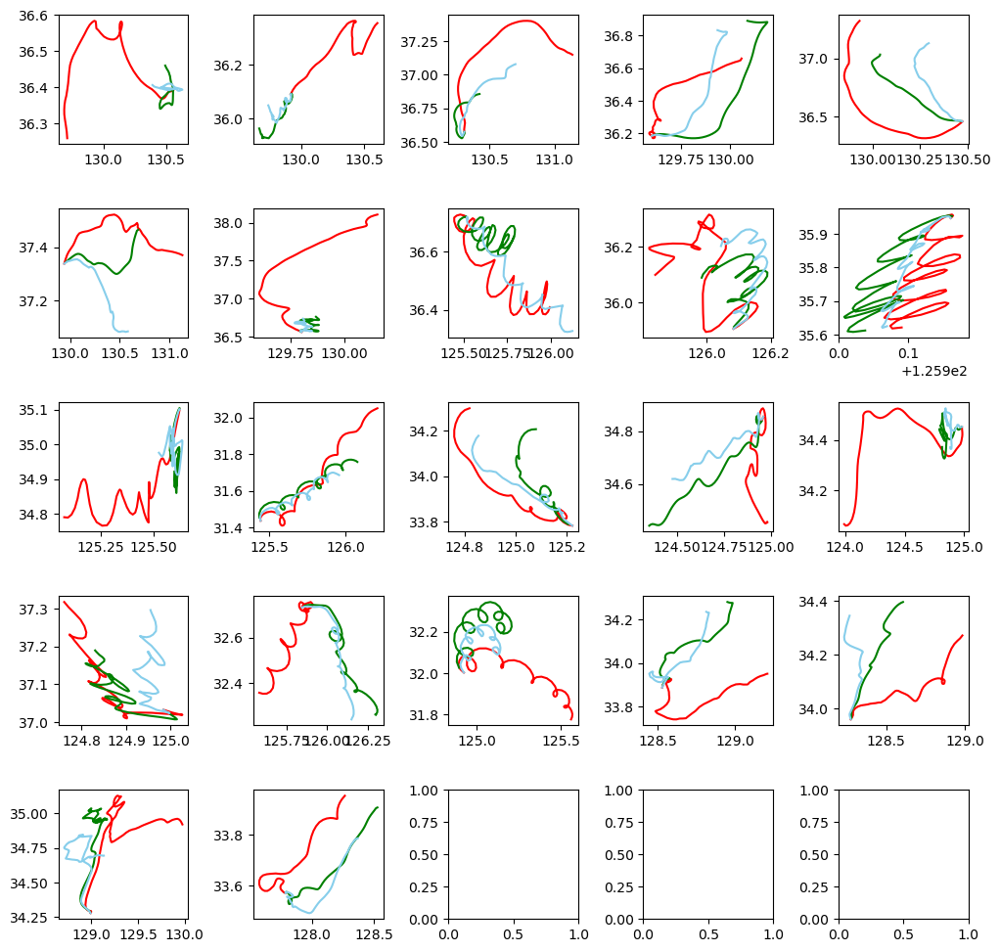

In [4]:
# Random & SGD stacking (meta_regressor = RD depth 2)
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import LogisticRegression
from mlxtend.regressor import StackingCVRegressor
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.activations import relu
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MAE
from sklearn.metrics import mean_absolute_error
import random

seed = 42
tf.keras.utils.set_random_seed(seed)
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

f, axes = plt.subplots(5, 5)
# 격자 크기 설정
f.set_size_inches((12, 12))
# 격자 여백 설정
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)
baseline_MAE_list = list() 
baseline_NCLS_list = list()
MAE_list = list()
NCLS_list = list()
test_case_list = list()

for i in range(len(dataset)):
    # train dataset
    train_X = pd.DataFrame()
    train_y = np.array([[]])
    train = dataset[0:i] + dataset[i+1:len(dataset)]
    
    AE_X = train[0][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_lon', 'diff_lat']]
    train_X = train[0][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']]
    train_y = train[0][['diff_lon', 'diff_lat']]
    # 첫 행은 훈련에서 제외
    AE_X = AE_X[1:]
    train_X = train_X[1:]
    train_y = train_y[1:].to_numpy()
    
    for j in range(1,len(train)):
        add = train[j][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_lon', 'diff_lat']]
        trina_xi = train[j][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']] 
        trina_yi = train[j][['diff_lon', 'diff_lat']]
        add = add[1:]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        AE_X = pd.concat([AE_X,add],ignore_index = True)
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
        
    # 과거 데이터 훈련데이터에 추가
    for k in range(len(only_train_dataset)):
        add =  only_train_dataset[k][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_lon', 'diff_lat']]
        trina_xi = only_train_dataset[k][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']] 
        trina_yi = only_train_dataset[k][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        add = add[1:]
        
        AE_X = pd.concat([AE_X,add],ignore_index = True)
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
    
    # Test dataset
    test = dataset[i]
    start_lon = dataset[i]['start_lon'][0]
    start_lat = dataset[i]['start_lat'][0]
    test_X = test[['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']]
    test_X = test_X[1:]
    test_y = test[['diff_lon', 'diff_lat']]
    test_y = test_y[1:].to_numpy()
    
    
    latent_dim = 12
    AE_X = AE_X.to_numpy()
    autoencoder = Autoencoder(latent_dim)
    autoencoder.compile(optimizer='adam', loss='mse')
    autoencoder.fit(AE_X,AE_X,
                    epochs=150,
                    shuffle=True)
    encoded = autoencoder.encoder(AE_X).numpy()
    decoded = autoencoder.decoder(encoded).numpy()
    add_X = decoded[:,[0,1,2,3]]
    add_y = decoded[:,[4,5]]
    
    train_X = np.concatenate((train_X.to_numpy(),add_X), axis = 0)
    train_y = np.concatenate((train_y,add_y), axis = 0)
    
    # 행단위로 살펴보기
    test_case_df = dataset[i][['time', 'obs_x1_lon', 'obs_x1_lat', 'wind_y','wind_x','water_velocity_y','water_velocity_x','model_x2_lon', 'model_x2_lat']]
    test_case_df['rf_lon'] = start_lon
    test_case_df['rf_lat'] = start_lat
    test_case_df['ncls_model'] = 0
    test_case_df['ncls_rf'] = 0
    
    train_X, test_X = roburst_scaler(train_X, test_X)
    
    # RF, SGD 모델 생성
    RD_lon = RandomForestRegressor(max_depth = 2, random_state = 42 )
    RD_lat = RandomForestRegressor(max_depth = 2, random_state = 42 )
    SGD_lon = SGDRegressor(penalty='l1', random_state=42)
    SGD_lat = SGDRegressor(penalty='l1', random_state=42)
    lightgb_lon = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    lightgb_lat = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    MLP_lon = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)
    MLP_lat = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)
    
    
    # stacking
    stack_lon = StackingCVRegressor(regressors=(RD_lon, SGD_lon,lightgb_lon,MLP_lon), 
                                    meta_regressor=lightgb_lon,
                                   random_state = 42)
    
    stack_lat = StackingCVRegressor(regressors=(RD_lat, SGD_lat,lightgb_lat,MLP_lat),
                                    meta_regressor=lightgb_lat,
                                   random_state = 42)
    # fit
    stack_lon.fit(train_X, train_y[:,0])
    stack_lat.fit(train_X, train_y[:,1])
    
    # predict
    y_pred_lon = stack_lon.predict(test_X)
    y_pred_lon = y_pred_lon.reshape((y_pred_lon.shape[0],1))
    y_pred_lat = stack_lat.predict(test_X)
    y_pred_lat = y_pred_lat.reshape((y_pred_lat.shape[0],1))
    y_pred = np.concatenate((y_pred_lon, y_pred_lat),axis=1)

    
    # case 별로 이상행 탐색
    for k in range(1,len(test_case_df)-1):
        test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
        test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
        test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
        test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
    
    test_case_df['rf_diff_lon'] = test_case_df['rf_lon'].diff()
    test_case_df['rf_diff_lon'][0] = 0
    test_case_df['rf_diff_lat'] = test_case_df['rf_lat'].diff()  
    test_case_df['rf_diff_lat'][0] = 0
    test_case_df['model_diff_lon'] = test_case_df['model_x2_lon'].diff() 
    test_case_df['model_diff_lon'][0] = 0
    test_case_df['model_diff_lat'] = test_case_df['model_x2_lat'].diff()
    test_case_df['model_diff_lat'][0] = 0
    test_case_list.append(test_case_df)
    
    # Plot
    lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred = drift_trajection_show(i,y_pred)
    row = i//5
    col = i%5
    axes[row][col].plot(lon, lat,'r-' ,baseline_lon, baseline_lat, 'g-', lon_pred, lat_pred, 'skyblue')   
    
    # evaluation 
    y = np.concatenate((lon.reshape((lon.shape[0],1)), lat.reshape((lat.shape[0],1))),axis = 1)
    pred = np.concatenate((lon_pred.reshape((lon_pred.shape[0],1)), lat_pred.reshape((lat_pred.shape[0],1))),axis =1)
    baseline_pred = np.concatenate((baseline_lon.reshape((baseline_lon.shape[0],1)), baseline_lat.reshape((baseline_lat.shape[0],1))),axis =1)
    
    #mae
    MAE_list.append(drift_mae(y, pred))
    baseline_MAE_list.append(drift_mae(y, baseline_pred))
    
    #NCLS
    NCLS_list.append(NCLS_score(y, pred))
    baseline_NCLS_list.append(NCLS_score(y, baseline_pred))
    
for i in range(len(MAE_list)):
    print('------------------------ Model ', i+1, '------------------------')
    print('baseline',str(i),' MAE : ',MAE_list[i])
    print('Model',str(i),' MAE : ', baseline_MAE_list[i])
    print('baseline',str(i),' NCLS : ',baseline_NCLS_list[i])
    print('Model',str(i),' NCLS : ', NCLS_list[i])

plt.show()

In [5]:
# MLP o 
mae_sum = 0
baseline_mae_sum = 0
NCLS_sum = 0
baseline_NCLS_sum = 0

for i in range(len(dataset)):
    mae_sum += MAE_list[i]
    baseline_mae_sum += baseline_MAE_list[i]
    NCLS_sum += NCLS_list[i]
    baseline_NCLS_sum += baseline_NCLS_list[i]

# 라이브러리 Mae    
print ('Model Mae : ', mae_sum/len(dataset) )
print ('Baseline Mae : ', baseline_mae_sum/len(dataset) )
print ('Model NCLS : ', NCLS_sum/len(dataset) )
print ('Baseline NCLS : ', baseline_NCLS_sum/len(dataset) )

Model Mae :  0.18095090304225658
Baseline Mae :  0.18057603746811715
Model NCLS :  0.5397418534839996
Baseline NCLS :  0.5326670971119444


Epoch 1/150
93/93 [==============================] - 0s 891us/step - loss: 8.5589
Epoch 2/150
93/93 [==============================] - 0s 929us/step - loss: 7.5268
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2339
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1395
Epoch 5/150
93/93 [==============================] - 0s 973us/step - loss: 7.0965
Epoch 6/150
93/93 [==============================] - 0s 908us/step - loss: 7.0726
Epoch 7/150
93/93 [==============================] - 0s 929us/step - loss: 7.0574
Epoch 8/150
93/93 [==============================] - 0s 897us/step - loss: 7.0469
Epoch 9/150
93/93 [==============================] - 0s 929us/step - loss: 7.0391
Epoch 10/150
93/93 [==============================] - 0s 963us/step - loss: 7.0332
Epoch 11/150
93/93 [==============================] - 0s 940us/step - loss: 7.0285
Epoch 12/150
93/93 [==============================] - 0s 924us/step - loss: 7.0247
Epoch 13/150
93/9

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingW

93/93 [==============================] - 0s 956us/step - loss: 8.1613
Epoch 2/150
93/93 [==============================] - 0s 984us/step - loss: 7.4991
Epoch 3/150
93/93 [==============================] - 0s 984us/step - loss: 7.3300
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2664
Epoch 5/150
93/93 [==============================] - 0s 995us/step - loss: 7.2354
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2175
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2060
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1978
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1919
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1873
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1837
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1808
Epoch 13/150
93/93 [=====================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

93/93 [==============================] - 0s 1ms/step - loss: 8.0238
Epoch 2/150
93/93 [==============================] - 0s 1ms/step - loss: 7.3271
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1727
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1169
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0843
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0648
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0524
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0439
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0379
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0333
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0298
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0270
Epoch 13/150
93/93 [=============================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

93/93 [==============================] - 0s 968us/step - loss: 8.2921
Epoch 2/150
93/93 [==============================] - 0s 1ms/step - loss: 7.5932
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.3465
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2595
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2221
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2013
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1883
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1795
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1733
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1686
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1650
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1621
Epoch 13/150
93/93 [===========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

93/93 [==============================] - 0s 919us/step - loss: 7.9235
Epoch 2/150
93/93 [==============================] - 0s 957us/step - loss: 7.3310
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1436
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0890
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0629
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0479
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0384
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0319
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0272
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0236
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0209
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0186
Epoch 13/150
93/93 [=========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

93/93 [==============================] - 1s 935us/step - loss: 8.1756
Epoch 2/150
93/93 [==============================] - 0s 1ms/step - loss: 7.3227
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1239
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0479
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0043
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9821
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9689
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9602
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9541
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9496
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9461
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9433
Epoch 13/150
93/93 [===========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the cave

93/93 [==============================] - 0s 902us/step - loss: 8.0441
Epoch 2/150
93/93 [==============================] - 0s 995us/step - loss: 7.4308
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2618
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2104
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1864
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1723
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1633
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1569
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1522
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1486
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1457
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1433
Epoch 13/150
93/93 [=========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingW

93/93 [==============================] - 0s 908us/step - loss: 8.0094
Epoch 2/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2017
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0032
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9295
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 6.8920
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 6.8706
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 6.8571
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 6.8477
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 6.8409
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 6.8358
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 6.8317
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 6.8284
Epoch 13/150
93/93 [===========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the cave

93/93 [==============================] - 0s 960us/step - loss: 7.6300
Epoch 2/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2626
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1582
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1191
Epoch 5/150
93/93 [==============================] - 0s 2ms/step - loss: 7.0988
Epoch 6/150
93/93 [==============================] - 0s 2ms/step - loss: 7.0867
Epoch 7/150
93/93 [==============================] - 0s 2ms/step - loss: 7.0789
Epoch 8/150
93/93 [==============================] - 0s 2ms/step - loss: 7.0734
Epoch 9/150
93/93 [==============================] - 0s 2ms/step - loss: 7.0694
Epoch 10/150
93/93 [==============================] - 0s 2ms/step - loss: 7.0662
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0637
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0616
Epoch 13/150
93/93 [===========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingW

93/93 [==============================] - 0s 929us/step - loss: 7.6761
Epoch 2/150
93/93 [==============================] - 0s 995us/step - loss: 7.2778
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1917
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1566
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1374
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1253
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1171
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1111
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1064
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1027
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0997
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0972
Epoch 13/150
93/93 [=========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the cave

93/93 [==============================] - 0s 853us/step - loss: 8.5571
Epoch 2/150
93/93 [==============================] - 0s 1ms/step - loss: 7.7004
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2853
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1807
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1429
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1236
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1121
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1043
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0988
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0947
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0914
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0888
Epoch 13/150
93/93 [===========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingW

93/93 [==============================] - 0s 946us/step - loss: 8.0078
Epoch 2/150
93/93 [==============================] - 0s 951us/step - loss: 7.4941
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2851
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2123
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1820
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1658
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1560
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1494
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1446
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1410
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1383
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1359
Epoch 13/150
93/93 [=========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

93/93 [==============================] - 0s 875us/step - loss: 7.8527
Epoch 2/150
93/93 [==============================] - 0s 995us/step - loss: 7.2458
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0787
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0247
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9992
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9846
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9754
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9690
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9644
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9608
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9580
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9557
Epoch 13/150
93/93 [=========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingW

93/93 [==============================] - 0s 891us/step - loss: 7.8823
Epoch 2/150
93/93 [==============================] - 0s 1ms/step - loss: 7.3235
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2262
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1885
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1691
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1573
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1497
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1443
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1404
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1373
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1350
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1330
Epoch 13/150
93/93 [===========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingW

93/93 [==============================] - 0s 962us/step - loss: 8.1149
Epoch 2/150
93/93 [==============================] - 0s 1ms/step - loss: 7.3812
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2238
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1680
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1400
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1236
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1130
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1057
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1004
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0963
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0932
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0907
Epoch 13/150
93/93 [===========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

93/93 [==============================] - 1s 921us/step - loss: 7.7757
Epoch 2/150
93/93 [==============================] - 0s 1ms/step - loss: 7.3393
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2283
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1887
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1684
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1559
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1477
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1418
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1375
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1342
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1316
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1294
Epoch 13/150
93/93 [===========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the cave

93/93 [==============================] - 0s 1ms/step - loss: 7.6121
Epoch 2/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2475
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1642
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1301
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1115
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1001
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0927
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0876
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0839
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0810
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0788
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0769
Epoch 13/150
93/93 [=============================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

93/93 [==============================] - 0s 929us/step - loss: 8.2715
Epoch 2/150
93/93 [==============================] - 0s 1ms/step - loss: 7.5457
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.3203
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2431
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2065
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1858
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1729
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1639
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1576
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1529
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1493
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1463
Epoch 13/150
93/93 [===========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

93/93 [==============================] - 0s 951us/step - loss: 7.7490
Epoch 2/150
93/93 [==============================] - 0s 1ms/step - loss: 7.2261
Epoch 3/150
93/93 [==============================] - 0s 984us/step - loss: 7.0948
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0469
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0224
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0073
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9972
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9898
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9844
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9801
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9767
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 6.9738
Epoch 13/150
93/93 [=========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the cave

93/93 [==============================] - 0s 875us/step - loss: 7.6419
Epoch 2/150
93/93 [==============================] - 0s 984us/step - loss: 7.2841
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1649
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1228
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1026
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0906
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0827
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0771
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0729
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0696
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0669
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0648
Epoch 13/150
93/93 [=========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the cave

90/90 [==============================] - 0s 943us/step - loss: 7.3973
Epoch 2/150
90/90 [==============================] - 0s 1ms/step - loss: 7.1055
Epoch 3/150
90/90 [==============================] - 0s 1ms/step - loss: 6.9741
Epoch 4/150
90/90 [==============================] - 0s 1ms/step - loss: 6.9239
Epoch 5/150
90/90 [==============================] - 0s 1ms/step - loss: 6.9022
Epoch 6/150
90/90 [==============================] - 0s 1ms/step - loss: 6.8908
Epoch 7/150
90/90 [==============================] - 0s 1ms/step - loss: 6.8839
Epoch 8/150
90/90 [==============================] - 0s 1ms/step - loss: 6.8792
Epoch 9/150
90/90 [==============================] - 0s 1ms/step - loss: 6.8758
Epoch 10/150
90/90 [==============================] - 0s 1ms/step - loss: 6.8732
Epoch 11/150
90/90 [==============================] - 0s 1ms/step - loss: 6.8712
Epoch 12/150
90/90 [==============================] - 0s 1ms/step - loss: 6.8695
Epoch 13/150
90/90 [===========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingW

Epoch 1/150


C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingW

93/93 [==============================] - 0s 929us/step - loss: 7.6286
Epoch 2/150
93/93 [==============================] - 0s 995us/step - loss: 7.2577
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1574
Epoch 4/150
93/93 [==============================] - 0s 1ms/step - loss: 7.1167
Epoch 5/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0952
Epoch 6/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0819
Epoch 7/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0731
Epoch 8/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0667
Epoch 9/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0620
Epoch 10/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0583
Epoch 11/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0555
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0531
Epoch 13/150
93/93 [=========================

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\1601845393.py:137: SettingW

------------------------ Model  1 ------------------------
baseline 0  MAE :  0.2607474038956004
Model 0  MAE :  0.2775706597222227
baseline 0  NCLS :  0.2578343637823395
Model 0  NCLS :  0.2863408956173119
------------------------ Model  2 ------------------------
baseline 1  MAE :  0.38013955321733117
Model 1  MAE :  0.4105121875000021
baseline 1  NCLS :  0
Model 1  NCLS :  0.002477100673090926
------------------------ Model  3 ------------------------
baseline 2  MAE :  0.2718381815105936
Model 2  MAE :  0.35204785416666873
baseline 2  NCLS :  0.303683671695795
Model 2  NCLS :  0.45169532126450107
------------------------ Model  4 ------------------------
baseline 3  MAE :  0.13345192073667012
Model 3  MAE :  0.23924403521126655
baseline 3  NCLS :  0
Model 3  NCLS :  0.3831843590405345
------------------------ Model  5 ------------------------
baseline 4  MAE :  0.19254842878252207
Model 4  MAE :  0.1435844929577459
baseline 4  NCLS :  0.6956370589263559
Model 4  NCLS :  0.568509808

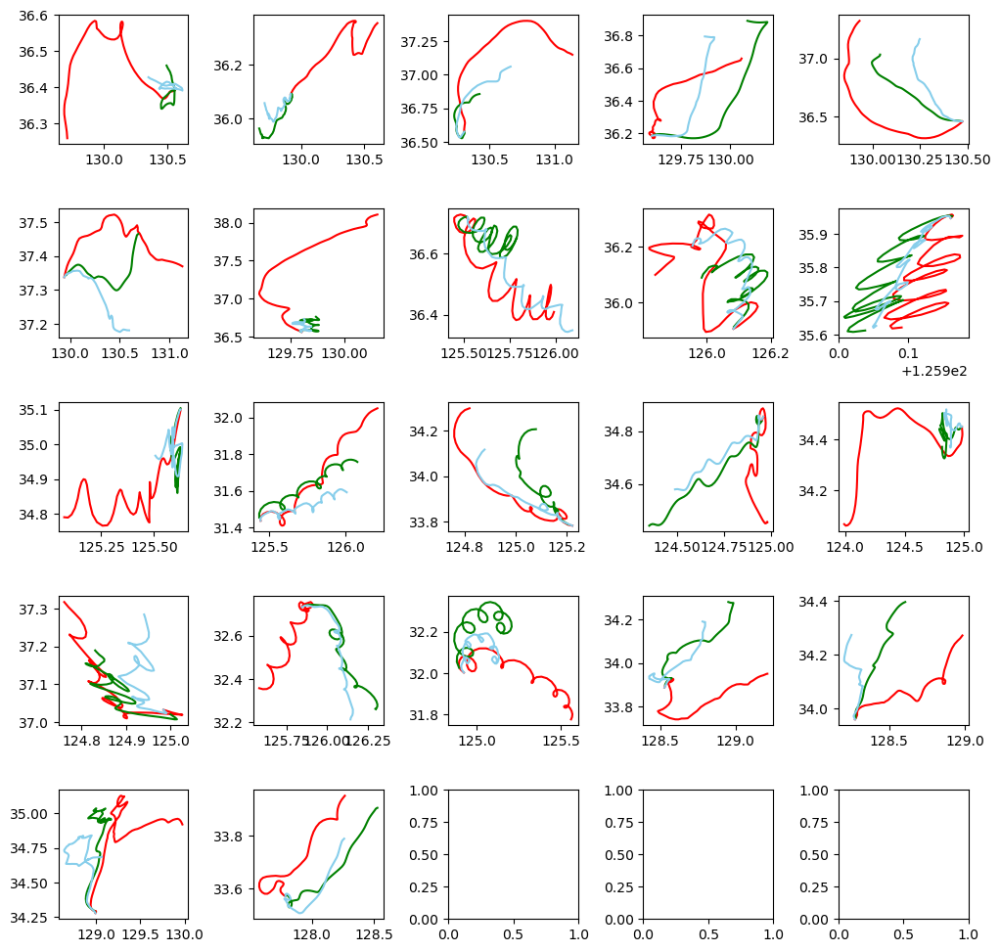

In [10]:
# Random & SGD stacking (meta_regressor = RD depth 2)33333333333333333
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import LogisticRegression
from mlxtend.regressor import StackingCVRegressor
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.activations import relu
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MAE
from sklearn.metrics import mean_absolute_error
import random

seed = 42
tf.keras.utils.set_random_seed(seed)
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

f, axes = plt.subplots(5, 5)
# 격자 크기 설정
f.set_size_inches((12, 12))
# 격자 여백 설정
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)
baseline_MAE_list = list() 
baseline_NCLS_list = list()
MAE_list = list()
NCLS_list = list()
test_case_list = list()

for i in range(len(dataset)):
    # train dataset
    train_X = pd.DataFrame()
    train_y = np.array([[]])
    train = dataset[0:i] + dataset[i+1:len(dataset)]
    
    AE_X = train[0][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_lon', 'diff_lat']]
    train_X = train[0][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']]
    train_y = train[0][['diff_lon', 'diff_lat']]
    # 첫 행은 훈련에서 제외
    AE_X = AE_X[1:]
    train_X = train_X[1:]
    train_y = train_y[1:].to_numpy()
    
    for j in range(1,len(train)):
        add = train[j][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_lon', 'diff_lat']]
        trina_xi = train[j][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']] 
        trina_yi = train[j][['diff_lon', 'diff_lat']]
        add = add[1:]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        AE_X = pd.concat([AE_X,add],ignore_index = True)
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
        
    # 과거 데이터 훈련데이터에 추가
    for k in range(len(only_train_dataset)):
        add =  only_train_dataset[k][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_lon', 'diff_lat']]
        trina_xi = only_train_dataset[k][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']] 
        trina_yi = only_train_dataset[k][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        add = add[1:]
        
        AE_X = pd.concat([AE_X,add],ignore_index = True)
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
    
    # Test dataset
    test = dataset[i]
    start_lon = dataset[i]['start_lon'][0]
    start_lat = dataset[i]['start_lat'][0]
    test_X = test[['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']]
    test_X = test_X[1:]
    test_y = test[['diff_lon', 'diff_lat']]
    test_y = test_y[1:].to_numpy()
    
    
    latent_dim = 20
    AE_X = AE_X.to_numpy()
    autoencoder = Autoencoder(latent_dim)
    autoencoder.compile(optimizer='adam', loss='mse')
    autoencoder.fit(AE_X,AE_X,
                    epochs=150,
                    shuffle=True)
    encoded = autoencoder.encoder(AE_X).numpy()
    decoded = autoencoder.decoder(encoded).numpy()
    add_X = decoded[:,[0,1,2,3]]
    add_y = decoded[:,[4,5]]
    
    train_X = np.concatenate((train_X.to_numpy(),add_X), axis = 0)
    train_y = np.concatenate((train_y,add_y), axis = 0)
    
    # 행단위로 살펴보기
    test_case_df = dataset[i][['time', 'obs_x1_lon', 'obs_x1_lat', 'wind_y','wind_x','water_velocity_y','water_velocity_x','model_x2_lon', 'model_x2_lat']]
    test_case_df['rf_lon'] = start_lon
    test_case_df['rf_lat'] = start_lat
    test_case_df['ncls_model'] = 0
    test_case_df['ncls_rf'] = 0
    
    # RF, SGD 모델 생성
    RD_lon = RandomForestRegressor(max_depth = 2, random_state = 42 )
    RD_lat = RandomForestRegressor(max_depth = 2, random_state = 42 )
    SGD_lon = SGDRegressor(penalty='l1', random_state=42)
    SGD_lat = SGDRegressor(penalty='l1', random_state=42)
    lightgb_lon = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    lightgb_lat = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    
    # stacking
    stack_lon = StackingCVRegressor(regressors=(SGD_lon,lightgb_lon), 
                                    meta_regressor=lightgb_lon,
                                   random_state = 42)
    
    stack_lat = StackingCVRegressor(regressors=(SGD_lat,lightgb_lat),
                                    meta_regressor=lightgb_lat,
                                   random_state = 42)
    # fit
    stack_lon.fit(train_X, train_y[:,0])
    stack_lat.fit(train_X, train_y[:,1])
    
    # predict
    y_pred_lon = stack_lon.predict(test_X)
    y_pred_lon = y_pred_lon.reshape((y_pred_lon.shape[0],1))
    y_pred_lat = stack_lat.predict(test_X)
    y_pred_lat = y_pred_lat.reshape((y_pred_lat.shape[0],1))
    y_pred = np.concatenate((y_pred_lon, y_pred_lat),axis=1)

    
    # case 별로 이상행 탐색
    for k in range(1,len(test_case_df)-1):
        test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
        test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
        test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
        test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
    
    test_case_df['rf_diff_lon'] = test_case_df['rf_lon'].diff()
    test_case_df['rf_diff_lon'][0] = 0
    test_case_df['rf_diff_lat'] = test_case_df['rf_lat'].diff()  
    test_case_df['rf_diff_lat'][0] = 0
    test_case_df['model_diff_lon'] = test_case_df['model_x2_lon'].diff() 
    test_case_df['model_diff_lon'][0] = 0
    test_case_df['model_diff_lat'] = test_case_df['model_x2_lat'].diff()
    test_case_df['model_diff_lat'][0] = 0
    test_case_list.append(test_case_df)
    
    # Plot
    lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred = drift_trajection_show(i,y_pred)
    row = i//5
    col = i%5
    axes[row][col].plot(lon, lat,'r-' ,baseline_lon, baseline_lat, 'g-', lon_pred, lat_pred, 'skyblue')   
    
    # evaluation 
    y = np.concatenate((lon.reshape((lon.shape[0],1)), lat.reshape((lat.shape[0],1))),axis = 1)
    pred = np.concatenate((lon_pred.reshape((lon_pred.shape[0],1)), lat_pred.reshape((lat_pred.shape[0],1))),axis =1)
    baseline_pred = np.concatenate((baseline_lon.reshape((baseline_lon.shape[0],1)), baseline_lat.reshape((baseline_lat.shape[0],1))),axis =1)
    
    #mae
    MAE_list.append(drift_mae(y, pred))
    baseline_MAE_list.append(drift_mae(y, baseline_pred))
    
    #NCLS
    NCLS_list.append(NCLS_score(y, pred))
    baseline_NCLS_list.append(NCLS_score(y, baseline_pred))
    
for i in range(len(MAE_list)):
    print('------------------------ Model ', i+1, '------------------------')
    print('baseline',str(i),' MAE : ',MAE_list[i])
    print('Model',str(i),' MAE : ', baseline_MAE_list[i])
    print('baseline',str(i),' NCLS : ',baseline_NCLS_list[i])
    print('Model',str(i),' NCLS : ', NCLS_list[i])

plt.show()

In [11]:
# 모델 2개 stacking & node 20
mae_sum = 0
baseline_mae_sum = 0
NCLS_sum = 0
baseline_NCLS_sum = 0

for i in range(len(dataset)):
    mae_sum += MAE_list[i]
    baseline_mae_sum += baseline_MAE_list[i]
    NCLS_sum += NCLS_list[i]
    baseline_NCLS_sum += baseline_NCLS_list[i]

# 라이브러리 Mae    
print ('Model Mae : ', mae_sum/len(dataset) )
print ('Baseline Mae : ', baseline_mae_sum/len(dataset) )
print ('Model NCLS : ', NCLS_sum/len(dataset) )
print ('Baseline NCLS : ', baseline_NCLS_sum/len(dataset) )

Model Mae :  0.17732946844822328
Baseline Mae :  0.18057603746811715
Model NCLS :  0.5470281326250811
Baseline NCLS :  0.5326670971119444


Epoch 1/100
93/93 [==============================] - 1s 2ms/step - loss: 8.7589
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 8.1823
Epoch 3/100
93/93 [==============================] - 0s 995us/step - loss: 7.8276
Epoch 4/100
93/93 [==============================] - 0s 965us/step - loss: 7.5866
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4074
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2891
Epoch 7/100
93/93 [==============================] - 0s 988us/step - loss: 7.2085
Epoch 8/100
93/93 [==============================] - 0s 970us/step - loss: 7.1534
Epoch 9/100
93/93 [==============================] - 0s 997us/step - loss: 7.1167
Epoch 10/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0924
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0758
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0641
Epoch 13/100
93/93 [=======

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWith

93/93 [==============================] - 1s 1ms/step - loss: 8.4932
Epoch 2/100
93/93 [==============================] - 0s 993us/step - loss: 7.9445
Epoch 3/100
93/93 [==============================] - 0s 983us/step - loss: 7.6299
Epoch 4/100
93/93 [==============================] - 0s 971us/step - loss: 7.4847
Epoch 5/100
93/93 [==============================] - 0s 997us/step - loss: 7.3967
Epoch 6/100
93/93 [==============================] - 0s 968us/step - loss: 7.3414
Epoch 7/100
93/93 [==============================] - 0s 979us/step - loss: 7.3064
Epoch 8/100
93/93 [==============================] - 0s 970us/step - loss: 7.2820
Epoch 9/100
93/93 [==============================] - 0s 987us/step - loss: 7.2632
Epoch 10/100
93/93 [==============================] - 0s 962us/step - loss: 7.2477
Epoch 11/100
93/93 [==============================] - 0s 978us/step - loss: 7.2347
Epoch 12/100
93/93 [==============================] - 0s 989us/step - loss: 7.2240
Epoch 13/100
93/93 [=======

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWith

Epoch 1/100
93/93 [==============================] - 1s 986us/step - loss: 8.9200
Epoch 2/100
93/93 [==============================] - 0s 972us/step - loss: 8.5895
Epoch 3/100
93/93 [==============================] - 0s 1ms/step - loss: 8.3528
Epoch 4/100
93/93 [==============================] - 0s 996us/step - loss: 8.1356
Epoch 5/100
93/93 [==============================] - 0s 979us/step - loss: 7.8817
Epoch 6/100
93/93 [==============================] - 0s 995us/step - loss: 7.6355
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4370
Epoch 8/100
93/93 [==============================] - 0s 978us/step - loss: 7.3066
Epoch 9/100
93/93 [==============================] - 0s 970us/step - loss: 7.2233
Epoch 10/100
93/93 [==============================] - 0s 996us/step - loss: 7.1710
Epoch 11/100
93/93 [==============================] - 0s 982us/step - loss: 7.1365
Epoch 12/100
93/93 [==============================] - 0s 994us/step - loss: 7.1124
Epoch 13/100
93/9

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/100
93/93 [==============================] - 0s 989us/step - loss: 8.4402
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 8.0465
Epoch 3/100
93/93 [==============================] - 0s 973us/step - loss: 7.7402
Epoch 4/100
93/93 [==============================] - 0s 987us/step - loss: 7.5609
Epoch 5/100
93/93 [==============================] - 0s 976us/step - loss: 7.4432
Epoch 6/100
93/93 [==============================] - 0s 970us/step - loss: 7.3544
Epoch 7/100
93/93 [==============================] - 0s 967us/step - loss: 7.2923
Epoch 8/100
93/93 [==============================] - 0s 967us/step - loss: 7.2528
Epoch 9/100
93/93 [==============================] - 0s 980us/step - loss: 7.2272
Epoch 10/100
93/93 [==============================] - 0s 987us/step - loss: 7.2096
Epoch 11/100
93/93 [==============================] - 0s 968us/step - loss: 7.1968
Epoch 12/100
93/93 [==============================] - 0s 978us/step - loss: 7.1873
Epoch 13/100
93

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/100
93/93 [==============================] - 1s 986us/step - loss: 8.5580
Epoch 2/100
93/93 [==============================] - 0s 979us/step - loss: 8.0813
Epoch 3/100
93/93 [==============================] - 0s 990us/step - loss: 7.6730
Epoch 4/100
93/93 [==============================] - 0s 953us/step - loss: 7.4273
Epoch 5/100
93/93 [==============================] - 0s 929us/step - loss: 7.2839
Epoch 6/100
93/93 [==============================] - 0s 929us/step - loss: 7.2078
Epoch 7/100
93/93 [==============================] - 0s 929us/step - loss: 7.1655
Epoch 8/100
93/93 [==============================] - 0s 919us/step - loss: 7.1361
Epoch 9/100
93/93 [==============================] - 0s 924us/step - loss: 7.1138
Epoch 10/100
93/93 [==============================] - 0s 946us/step - loss: 7.0958
Epoch 11/100
93/93 [==============================] - 0s 943us/step - loss: 7.0817
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.0705
Epoch 13/100
93

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/100
93/93 [==============================] - 0s 988us/step - loss: 8.3358
Epoch 2/100
93/93 [==============================] - 0s 956us/step - loss: 8.0525
Epoch 3/100
93/93 [==============================] - 0s 983us/step - loss: 7.8254
Epoch 4/100
93/93 [==============================] - 0s 987us/step - loss: 7.6215
Epoch 5/100
93/93 [==============================] - 0s 978us/step - loss: 7.4284
Epoch 6/100
93/93 [==============================] - 0s 984us/step - loss: 7.2435
Epoch 7/100
93/93 [==============================] - 0s 963us/step - loss: 7.1142
Epoch 8/100
93/93 [==============================] - 0s 976us/step - loss: 7.0616
Epoch 9/100
93/93 [==============================] - 0s 988us/step - loss: 7.0318
Epoch 10/100
93/93 [==============================] - 0s 986us/step - loss: 7.0113
Epoch 11/100
93/93 [==============================] - 0s 981us/step - loss: 6.9965
Epoch 12/100
93/93 [==============================] - 0s 971us/step - loss: 6.9855
Epoch 13/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWith

Epoch 1/100
93/93 [==============================] - 0s 972us/step - loss: 8.0752
Epoch 2/100
93/93 [==============================] - 0s 980us/step - loss: 7.7769
Epoch 3/100
93/93 [==============================] - 0s 997us/step - loss: 7.5583
Epoch 4/100
93/93 [==============================] - 0s 981us/step - loss: 7.4060
Epoch 5/100
93/93 [==============================] - 0s 986us/step - loss: 7.3157
Epoch 6/100
93/93 [==============================] - 0s 966us/step - loss: 7.2625
Epoch 7/100
93/93 [==============================] - 0s 990us/step - loss: 7.2289
Epoch 8/100
93/93 [==============================] - 0s 984us/step - loss: 7.2068
Epoch 9/100
93/93 [==============================] - 0s 970us/step - loss: 7.1917
Epoch 10/100
93/93 [==============================] - 0s 981us/step - loss: 7.1809
Epoch 11/100
93/93 [==============================] - 0s 982us/step - loss: 7.1730
Epoch 12/100
93/93 [==============================] - 0s 988us/step - loss: 7.1667
Epoch 13/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

93/93 [==============================] - 0s 988us/step - loss: 8.5523
Epoch 2/100
93/93 [==============================] - 0s 958us/step - loss: 8.1953
Epoch 3/100
93/93 [==============================] - 0s 955us/step - loss: 7.7603
Epoch 4/100
93/93 [==============================] - 0s 963us/step - loss: 7.4724
Epoch 5/100
93/93 [==============================] - 0s 968us/step - loss: 7.2762
Epoch 6/100
93/93 [==============================] - 0s 974us/step - loss: 7.1305
Epoch 7/100
93/93 [==============================] - 0s 951us/step - loss: 7.0377
Epoch 8/100
93/93 [==============================] - 0s 962us/step - loss: 6.9789
Epoch 9/100
93/93 [==============================] - 0s 969us/step - loss: 6.9408
Epoch 10/100
93/93 [==============================] - 0s 950us/step - loss: 6.9147
Epoch 11/100
93/93 [==============================] - 0s 977us/step - loss: 6.8960
Epoch 12/100
93/93 [==============================] - 0s 949us/step - loss: 6.8819
Epoch 13/100
93/93 [=====

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/100
93/93 [==============================] - 1s 971us/step - loss: 8.3914
Epoch 2/100
93/93 [==============================] - 0s 953us/step - loss: 7.9956
Epoch 3/100
93/93 [==============================] - 0s 975us/step - loss: 7.7551
Epoch 4/100
93/93 [==============================] - 0s 992us/step - loss: 7.6118
Epoch 5/100
93/93 [==============================] - 0s 970us/step - loss: 7.5231
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4632
Epoch 7/100
93/93 [==============================] - 0s 987us/step - loss: 7.4180
Epoch 8/100
93/93 [==============================] - 0s 961us/step - loss: 7.3829
Epoch 9/100
93/93 [==============================] - 0s 973us/step - loss: 7.3538
Epoch 10/100
93/93 [==============================] - 0s 970us/step - loss: 7.3294
Epoch 11/100
93/93 [==============================] - 0s 971us/step - loss: 7.3080
Epoch 12/100
93/93 [==============================] - 0s 957us/step - loss: 7.2887
Epoch 13/100
93

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/100
93/93 [==============================] - 1s 983us/step - loss: 8.4538
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 8.0001
Epoch 3/100
93/93 [==============================] - 0s 987us/step - loss: 7.6553
Epoch 4/100
93/93 [==============================] - 0s 974us/step - loss: 7.4888
Epoch 5/100
93/93 [==============================] - 0s 989us/step - loss: 7.3810
Epoch 6/100
93/93 [==============================] - 0s 971us/step - loss: 7.3106
Epoch 7/100
93/93 [==============================] - 0s 978us/step - loss: 7.2646
Epoch 8/100
93/93 [==============================] - 0s 996us/step - loss: 7.2343
Epoch 9/100
93/93 [==============================] - 0s 987us/step - loss: 7.2118
Epoch 10/100
93/93 [==============================] - 0s 979us/step - loss: 7.1933
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1772
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1628
Epoch 13/100
93/93 

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWith

Epoch 1/100
93/93 [==============================] - 0s 986us/step - loss: 8.3364
Epoch 2/100
93/93 [==============================] - 0s 976us/step - loss: 7.9223
Epoch 3/100
93/93 [==============================] - 0s 970us/step - loss: 7.6635
Epoch 4/100
93/93 [==============================] - 0s 990us/step - loss: 7.5102
Epoch 5/100
93/93 [==============================] - 0s 977us/step - loss: 7.3962
Epoch 6/100
93/93 [==============================] - 0s 962us/step - loss: 7.3006
Epoch 7/100
93/93 [==============================] - 0s 970us/step - loss: 7.2330
Epoch 8/100
93/93 [==============================] - 0s 982us/step - loss: 7.1868
Epoch 9/100
93/93 [==============================] - 0s 974us/step - loss: 7.1579
Epoch 10/100
93/93 [==============================] - 0s 977us/step - loss: 7.1395
Epoch 11/100
93/93 [==============================] - 0s 973us/step - loss: 7.1270
Epoch 12/100
93/93 [==============================] - 0s 975us/step - loss: 7.1183
Epoch 13/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

93/93 [==============================] - 1s 978us/step - loss: 8.1663
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 7.8313
Epoch 3/100
93/93 [==============================] - 0s 1ms/step - loss: 7.5920
Epoch 4/100
93/93 [==============================] - 0s 958us/step - loss: 7.4481
Epoch 5/100
93/93 [==============================] - 0s 984us/step - loss: 7.3627
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3112
Epoch 7/100
93/93 [==============================] - 0s 983us/step - loss: 7.2756
Epoch 8/100
93/93 [==============================] - 0s 984us/step - loss: 7.2492
Epoch 9/100
93/93 [==============================] - 0s 986us/step - loss: 7.2285
Epoch 10/100
93/93 [==============================] - 0s 999us/step - loss: 7.2114
Epoch 11/100
93/93 [==============================] - 0s 983us/step - loss: 7.1971
Epoch 12/100
93/93 [==============================] - 0s 992us/step - loss: 7.1852
Epoch 13/100
93/93 [===========

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/100
93/93 [==============================] - 1s 999us/step - loss: 8.6815
Epoch 2/100
93/93 [==============================] - 0s 972us/step - loss: 8.3040
Epoch 3/100
93/93 [==============================] - 0s 969us/step - loss: 8.0433
Epoch 4/100
93/93 [==============================] - 0s 968us/step - loss: 7.8577
Epoch 5/100
93/93 [==============================] - 0s 983us/step - loss: 7.6684
Epoch 6/100
93/93 [==============================] - 0s 957us/step - loss: 7.4677
Epoch 7/100
93/93 [==============================] - 0s 969us/step - loss: 7.2851
Epoch 8/100
93/93 [==============================] - 0s 969us/step - loss: 7.1616
Epoch 9/100
93/93 [==============================] - 0s 961us/step - loss: 7.0927
Epoch 10/100
93/93 [==============================] - 0s 972us/step - loss: 7.0542
Epoch 11/100
93/93 [==============================] - 0s 967us/step - loss: 7.0307
Epoch 12/100
93/93 [==============================] - 0s 973us/step - loss: 7.0152
Epoch 13/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame



Epoch 1/100
93/93 [==============================] - 0s 957us/step - loss: 8.8043
Epoch 2/100
93/93 [==============================] - 0s 974us/step - loss: 8.4950
Epoch 3/100
93/93 [==============================] - 0s 960us/step - loss: 8.1186
Epoch 4/100
93/93 [==============================] - 0s 977us/step - loss: 7.5881
Epoch 5/100
93/93 [==============================] - 0s 969us/step - loss: 7.3880
Epoch 6/100
93/93 [==============================] - 0s 986us/step - loss: 7.3176
Epoch 7/100
93/93 [==============================] - 0s 955us/step - loss: 7.2727
Epoch 8/100
93/93 [==============================] - 0s 959us/step - loss: 7.2396
Epoch 9/100
93/93 [==============================] - 0s 957us/step - loss: 7.2150
Epoch 10/100
93/93 [==============================] - 0s 948us/step - loss: 7.1968
Epoch 11/100
93/93 [==============================] - 0s 958us/step - loss: 7.1834
Epoch 12/100
93/93 [==============================] - 0s 971us/step - loss: 7.1730
Epoch 13/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/100
93/93 [==============================] - 0s 987us/step - loss: 8.1312
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 7.8055
Epoch 3/100
93/93 [==============================] - 0s 992us/step - loss: 7.5582
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3844
Epoch 5/100
93/93 [==============================] - 0s 986us/step - loss: 7.2708
Epoch 6/100
93/93 [==============================] - 0s 974us/step - loss: 7.2103
Epoch 7/100
93/93 [==============================] - 0s 994us/step - loss: 7.1756
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1542
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1393
Epoch 10/100
93/93 [==============================] - 0s 995us/step - loss: 7.1283
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1201
Epoch 12/100
93/93 [==============================] - 0s 2ms/step - loss: 7.1136
Epoch 13/100
93/93 [=====

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/100
93/93 [==============================] - 0s 998us/step - loss: 8.3325
Epoch 2/100
93/93 [==============================] - 0s 983us/step - loss: 8.0668
Epoch 3/100
93/93 [==============================] - 0s 992us/step - loss: 7.9324
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.8392
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.7618
Epoch 6/100
93/93 [==============================] - 0s 988us/step - loss: 7.6920
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.6299
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.5719
Epoch 9/100
93/93 [==============================] - 0s 990us/step - loss: 7.5159
Epoch 10/100
93/93 [==============================] - 0s 993us/step - loss: 7.4609
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4160
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3783
Epoch 13/100
93/93 [=====

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWith

Epoch 1/100
93/93 [==============================] - 0s 961us/step - loss: 8.9102
Epoch 2/100
93/93 [==============================] - 0s 980us/step - loss: 8.4947
Epoch 3/100
93/93 [==============================] - 0s 999us/step - loss: 8.1150
Epoch 4/100
93/93 [==============================] - 0s 977us/step - loss: 7.9042
Epoch 5/100
93/93 [==============================] - 0s 974us/step - loss: 7.7738
Epoch 6/100
93/93 [==============================] - 0s 958us/step - loss: 7.6692
Epoch 7/100
93/93 [==============================] - 0s 988us/step - loss: 7.5660
Epoch 8/100
93/93 [==============================] - 0s 990us/step - loss: 7.4682
Epoch 9/100
93/93 [==============================] - 0s 945us/step - loss: 7.3765
Epoch 10/100
93/93 [==============================] - 0s 973us/step - loss: 7.2861
Epoch 11/100
93/93 [==============================] - 0s 972us/step - loss: 7.2163
Epoch 12/100
93/93 [==============================] - 0s 970us/step - loss: 7.1776
Epoch 13/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

93/93 [==============================] - 0s 989us/step - loss: 7.8489
Epoch 2/100
93/93 [==============================] - 0s 977us/step - loss: 7.5845
Epoch 3/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4375
Epoch 4/100
93/93 [==============================] - 0s 968us/step - loss: 7.3582
Epoch 5/100
93/93 [==============================] - 0s 1000us/step - loss: 7.3128
Epoch 6/100
93/93 [==============================] - 0s 999us/step - loss: 7.2824
Epoch 7/100
93/93 [==============================] - 0s 975us/step - loss: 7.2584
Epoch 8/100
93/93 [==============================] - 0s 995us/step - loss: 7.2372
Epoch 9/100
93/93 [==============================] - 0s 970us/step - loss: 7.2187
Epoch 10/100
93/93 [==============================] - 0s 982us/step - loss: 7.2036
Epoch 11/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1916
Epoch 12/100
93/93 [==============================] - 0s 986us/step - loss: 7.1819
Epoch 13/100
93/93 [========

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWith

Epoch 1/100
93/93 [==============================] - 1s 989us/step - loss: 8.3983
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 8.0429
Epoch 3/100
93/93 [==============================] - 0s 1ms/step - loss: 7.8071
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.6467
Epoch 5/100
93/93 [==============================] - 0s 1ms/step - loss: 7.5158
Epoch 6/100
93/93 [==============================] - 0s 986us/step - loss: 7.4032
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3098
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2190
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1377
Epoch 10/100
93/93 [==============================] - 0s 998us/step - loss: 7.0799
Epoch 11/100
93/93 [==============================] - 0s 971us/step - loss: 7.0448
Epoch 12/100
93/93 [==============================] - 0s 997us/step - loss: 7.0240
Epoch 13/100
93/93 [=======

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/100


C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

93/93 [==============================] - 1s 1ms/step - loss: 8.0215
Epoch 2/100
93/93 [==============================] - 0s 967us/step - loss: 7.8195
Epoch 3/100
93/93 [==============================] - 0s 971us/step - loss: 7.6337
Epoch 4/100
93/93 [==============================] - 0s 1ms/step - loss: 7.4666
Epoch 5/100
93/93 [==============================] - 0s 966us/step - loss: 7.3416
Epoch 6/100
93/93 [==============================] - 0s 959us/step - loss: 7.2650
Epoch 7/100
93/93 [==============================] - 0s 990us/step - loss: 7.2040
Epoch 8/100
93/93 [==============================] - 0s 987us/step - loss: 7.1545
Epoch 9/100
93/93 [==============================] - 0s 965us/step - loss: 7.1232
Epoch 10/100
93/93 [==============================] - 0s 978us/step - loss: 7.1042
Epoch 11/100
93/93 [==============================] - 0s 949us/step - loss: 7.0923
Epoch 12/100
93/93 [==============================] - 0s 979us/step - loss: 7.0842
Epoch 13/100
93/93 [=========

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWith

Epoch 1/100
90/90 [==============================] - 0s 1ms/step - loss: 7.9413
Epoch 2/100
90/90 [==============================] - 0s 1ms/step - loss: 7.6050
Epoch 3/100
90/90 [==============================] - 0s 984us/step - loss: 7.4061
Epoch 4/100
90/90 [==============================] - 0s 1ms/step - loss: 7.2933
Epoch 5/100
90/90 [==============================] - 0s 993us/step - loss: 7.2193
Epoch 6/100
90/90 [==============================] - 0s 983us/step - loss: 7.1630
Epoch 7/100
90/90 [==============================] - 0s 1ms/step - loss: 7.1201
Epoch 8/100
90/90 [==============================] - 0s 1ms/step - loss: 7.0873
Epoch 9/100
90/90 [==============================] - 0s 1ms/step - loss: 7.0616
Epoch 10/100
90/90 [==============================] - 0s 1ms/step - loss: 7.0410
Epoch 11/100
90/90 [==============================] - 0s 996us/step - loss: 7.0239
Epoch 12/100
90/90 [==============================] - 0s 1ms/step - loss: 7.0093
Epoch 13/100
90/90 [=========

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:139: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWith

Epoch 1/100
93/93 [==============================] - 0s 999us/step - loss: 8.1538
Epoch 2/100
93/93 [==============================] - 0s 1ms/step - loss: 7.8482
Epoch 3/100
93/93 [==============================] - 0s 994us/step - loss: 7.6612
Epoch 4/100
93/93 [==============================] - 0s 985us/step - loss: 7.5327
Epoch 5/100
93/93 [==============================] - 0s 989us/step - loss: 7.4296
Epoch 6/100
93/93 [==============================] - 0s 1ms/step - loss: 7.3390
Epoch 7/100
93/93 [==============================] - 0s 1ms/step - loss: 7.2557
Epoch 8/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1991
Epoch 9/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1606
Epoch 10/100
93/93 [==============================] - 0s 999us/step - loss: 7.1346
Epoch 11/100
93/93 [==============================] - 0s 995us/step - loss: 7.1165
Epoch 12/100
93/93 [==============================] - 0s 1ms/step - loss: 7.1035
Epoch 13/100
93/93 [=====

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_24912\168694322.py:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

------------------------ Model  1 ------------------------
baseline 0  MAE :  0.2640433764281774
Model 0  MAE :  0.2775706597222227
baseline 0  NCLS :  0.2578343637823395
Model 0  NCLS :  0.27951615888723436
------------------------ Model  2 ------------------------
baseline 1  MAE :  0.3736999174304217
Model 1  MAE :  0.4105121875000021
baseline 1  NCLS :  0
Model 1  NCLS :  0.01937129959373529
------------------------ Model  3 ------------------------
baseline 2  MAE :  0.276865871819626
Model 2  MAE :  0.35204785416666873
baseline 2  NCLS :  0.303683671695795
Model 2  NCLS :  0.4380217865298913
------------------------ Model  4 ------------------------
baseline 3  MAE :  0.12966393796972842
Model 3  MAE :  0.23924403521126655
baseline 3  NCLS :  0
Model 3  NCLS :  0.40748965211394483
------------------------ Model  5 ------------------------
baseline 4  MAE :  0.2023052191953048
Model 4  MAE :  0.1435844929577459
baseline 4  NCLS :  0.6956370589263559
Model 4  NCLS :  0.545388978087

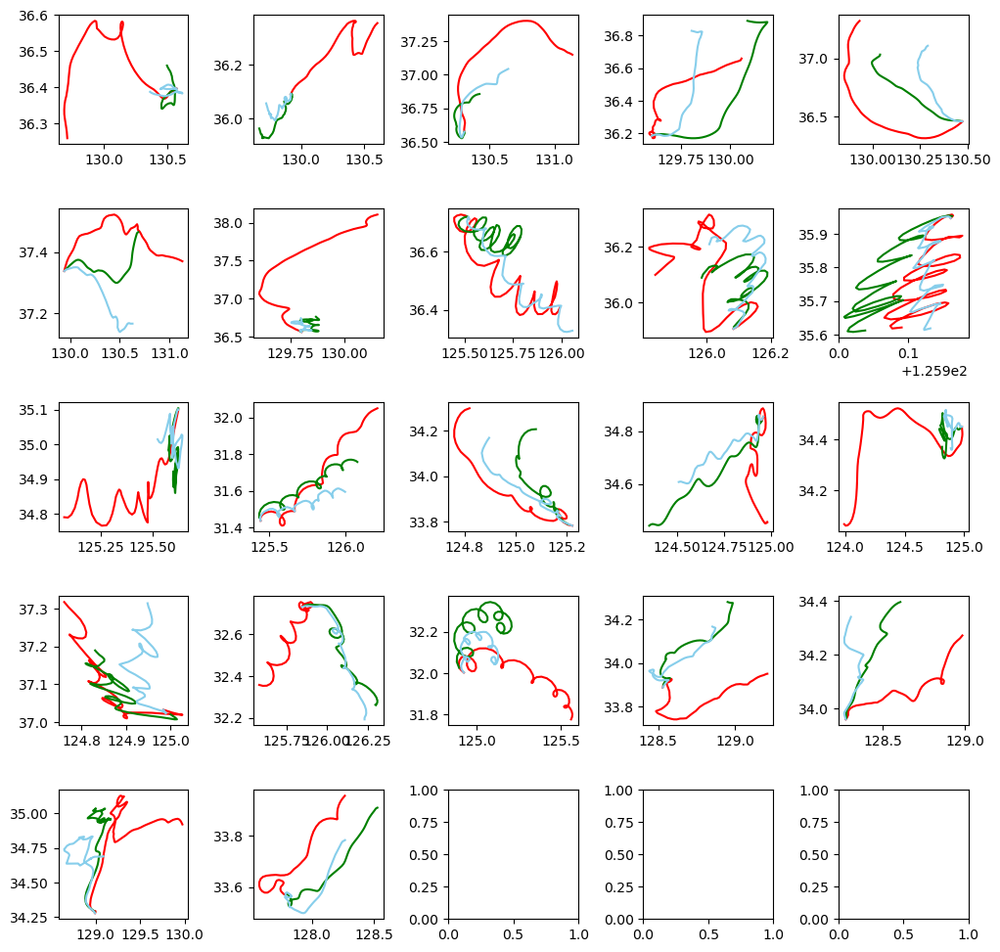

In [8]:
# Random & SGD stacking (meta_regressor = RD depth 2)
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import LogisticRegression
from mlxtend.regressor import StackingCVRegressor
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.activations import relu
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MAE
from sklearn.metrics import mean_absolute_error
import random

seed = 42
tf.keras.utils.set_random_seed(seed)
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

f, axes = plt.subplots(5, 5)
# 격자 크기 설정
f.set_size_inches((12, 12))
# 격자 여백 설정
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)
baseline_MAE_list = list() 
baseline_NCLS_list = list()
MAE_list = list()
NCLS_list = list()
test_case_list = list()

for i in range(len(dataset)):
    # train dataset
    train_X = pd.DataFrame()
    train_y = np.array([[]])
    train = dataset[0:i] + dataset[i+1:len(dataset)]
    
    AE_X = train[0][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_lon', 'diff_lat']]
    train_X = train[0][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']]
    train_y = train[0][['diff_lon', 'diff_lat']]
    # 첫 행은 훈련에서 제외
    AE_X = AE_X[1:]
    train_X = train_X[1:]
    train_y = train_y[1:].to_numpy()
    
    for j in range(1,len(train)):
        add = train[j][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_lon', 'diff_lat']]
        trina_xi = train[j][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']] 
        trina_yi = train[j][['diff_lon', 'diff_lat']]
        add = add[1:]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        AE_X = pd.concat([AE_X,add],ignore_index = True)
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
        
    # 과거 데이터 훈련데이터에 추가
    for k in range(len(only_train_dataset)):
        add =  only_train_dataset[k][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_lon', 'diff_lat']]
        trina_xi = only_train_dataset[k][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']] 
        trina_yi = only_train_dataset[k][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        add = add[1:]
        
        AE_X = pd.concat([AE_X,add],ignore_index = True)
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
    
    # Test dataset
    test = dataset[i]
    start_lon = dataset[i]['start_lon'][0]
    start_lat = dataset[i]['start_lat'][0]
    test_X = test[['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']]
    test_X = test_X[1:]
    test_y = test[['diff_lon', 'diff_lat']]
    test_y = test_y[1:].to_numpy()
    
    
    latent_dim = 20
    AE_X = AE_X.to_numpy()
    autoencoder = Autoencoder(latent_dim)
    autoencoder.compile(optimizer='adam', loss='mse')
    autoencoder.fit(AE_X,AE_X,
                    epochs=100,
                    shuffle=True)
    encoded = autoencoder.encoder(AE_X).numpy()
    decoded = autoencoder.decoder(encoded).numpy()
    add_X = decoded[:,[0,1,2,3]]
    add_y = decoded[:,[4,5]]
    
    train_X = np.concatenate((train_X.to_numpy(),add_X), axis = 0)
    train_y = np.concatenate((train_y,add_y), axis = 0)
    
    # 행단위로 살펴보기
    test_case_df = dataset[i][['time', 'obs_x1_lon', 'obs_x1_lat', 'wind_y','wind_x','water_velocity_y','water_velocity_x','model_x2_lon', 'model_x2_lat']]
    test_case_df['rf_lon'] = start_lon
    test_case_df['rf_lat'] = start_lat
    test_case_df['ncls_model'] = 0
    test_case_df['ncls_rf'] = 0
    
    # RF, SGD 모델 생성
    RD_lon = RandomForestRegressor(max_depth = 2, random_state = 42 )
    RD_lat = RandomForestRegressor(max_depth = 2, random_state = 42 )
    SGD_lon = SGDRegressor(penalty='l1', random_state=42)
    SGD_lat = SGDRegressor(penalty='l1', random_state=42)
    lightgb_lon = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    lightgb_lat = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    
    # stacking
    stack_lon = StackingCVRegressor(regressors=(RD_lon, SGD_lon,lightgb_lon), 
                                    meta_regressor=lightgb_lon,
                                   random_state = 42)
    
    stack_lat = StackingCVRegressor(regressors=(RD_lat, SGD_lat,lightgb_lat),
                                    meta_regressor=lightgb_lat,
                                   random_state = 42)
    # fit
    stack_lon.fit(train_X, train_y[:,0])
    stack_lat.fit(train_X, train_y[:,1])
    
    # predict
    y_pred_lon = stack_lon.predict(test_X)
    y_pred_lon = y_pred_lon.reshape((y_pred_lon.shape[0],1))
    y_pred_lat = stack_lat.predict(test_X)
    y_pred_lat = y_pred_lat.reshape((y_pred_lat.shape[0],1))
    y_pred = np.concatenate((y_pred_lon, y_pred_lat),axis=1)

    
    # case 별로 이상행 탐색
    for k in range(1,len(test_case_df)-1):
        test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
        test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
        test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
        test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
    
    test_case_df['rf_diff_lon'] = test_case_df['rf_lon'].diff()
    test_case_df['rf_diff_lon'][0] = 0
    test_case_df['rf_diff_lat'] = test_case_df['rf_lat'].diff()  
    test_case_df['rf_diff_lat'][0] = 0
    test_case_df['model_diff_lon'] = test_case_df['model_x2_lon'].diff() 
    test_case_df['model_diff_lon'][0] = 0
    test_case_df['model_diff_lat'] = test_case_df['model_x2_lat'].diff()
    test_case_df['model_diff_lat'][0] = 0
    test_case_list.append(test_case_df)
    
    # Plot
    lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred = drift_trajection_show(i,y_pred)
    row = i//5
    col = i%5
    axes[row][col].plot(lon, lat,'r-' ,baseline_lon, baseline_lat, 'g-', lon_pred, lat_pred, 'skyblue')   
    
    # evaluation 
    y = np.concatenate((lon.reshape((lon.shape[0],1)), lat.reshape((lat.shape[0],1))),axis = 1)
    pred = np.concatenate((lon_pred.reshape((lon_pred.shape[0],1)), lat_pred.reshape((lat_pred.shape[0],1))),axis =1)
    baseline_pred = np.concatenate((baseline_lon.reshape((baseline_lon.shape[0],1)), baseline_lat.reshape((baseline_lat.shape[0],1))),axis =1)
    
    #mae
    MAE_list.append(drift_mae(y, pred))
    baseline_MAE_list.append(drift_mae(y, baseline_pred))
    
    #NCLS
    NCLS_list.append(NCLS_score(y, pred))
    baseline_NCLS_list.append(NCLS_score(y, baseline_pred))
    
for i in range(len(MAE_list)):
    print('------------------------ Model ', i+1, '------------------------')
    print('baseline',str(i),' MAE : ',MAE_list[i])
    print('Model',str(i),' MAE : ', baseline_MAE_list[i])
    print('baseline',str(i),' NCLS : ',baseline_NCLS_list[i])
    print('Model',str(i),' NCLS : ', NCLS_list[i])

plt.show()

In [9]:
# MLP X 
mae_sum = 0
baseline_mae_sum = 0
NCLS_sum = 0
baseline_NCLS_sum = 0

for i in range(len(dataset)):
    mae_sum += MAE_list[i]
    baseline_mae_sum += baseline_MAE_list[i]
    NCLS_sum += NCLS_list[i]
    baseline_NCLS_sum += baseline_NCLS_list[i]

# 라이브러리 Mae    
print ('Model Mae : ', mae_sum/len(dataset) )
print ('Baseline Mae : ', baseline_mae_sum/len(dataset) )
print ('Model NCLS : ', NCLS_sum/len(dataset) )
print ('Baseline NCLS : ', baseline_NCLS_sum/len(dataset) )

Model Mae :  0.1792975562961105
Baseline Mae :  0.18057603746811715
Model NCLS :  0.5471514558687264
Baseline NCLS :  0.5326670971119444


Epoch 1/150
93/93 [==============================] - 0s 962us/step - loss: 7.8929
Epoch 2/150
93/93 [==============================] - 0s 940us/step - loss: 7.2325
Epoch 3/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0948
Epoch 4/150
93/93 [==============================] - 0s 995us/step - loss: 7.0586
Epoch 5/150
93/93 [==============================] - 0s 973us/step - loss: 7.0408
Epoch 6/150
93/93 [==============================] - 0s 984us/step - loss: 7.0304
Epoch 7/150
93/93 [==============================] - 0s 973us/step - loss: 7.0237
Epoch 8/150
93/93 [==============================] - 0s 951us/step - loss: 7.0190
Epoch 9/150
93/93 [==============================] - 0s 950us/step - loss: 7.0156
Epoch 10/150
93/93 [==============================] - 0s 984us/step - loss: 7.0129
Epoch 11/150
93/93 [==============================] - 0s 984us/step - loss: 7.0108
Epoch 12/150
93/93 [==============================] - 0s 1ms/step - loss: 7.0091
Epoch 13/150
93/9

93/93 [==============================] - 0s 951us/step - loss: 6.9884
Epoch 101/150
93/93 [==============================] - 0s 973us/step - loss: 6.9884
Epoch 102/150
93/93 [==============================] - 0s 951us/step - loss: 6.9884
Epoch 103/150
93/93 [==============================] - 0s 984us/step - loss: 6.9884
Epoch 104/150
93/93 [==============================] - 0s 973us/step - loss: 6.9884
Epoch 105/150
93/93 [==============================] - 0s 951us/step - loss: 6.9884
Epoch 106/150
93/93 [==============================] - 0s 962us/step - loss: 6.9884
Epoch 107/150
93/93 [==============================] - 0s 973us/step - loss: 6.9884
Epoch 108/150
93/93 [==============================] - 0s 967us/step - loss: 6.9884
Epoch 109/150
93/93 [==============================] - 0s 957us/step - loss: 6.9884
Epoch 110/150
93/93 [==============================] - 0s 995us/step - loss: 6.9884
Epoch 111/150
93/93 [==============================] - 0s 984us/step - loss: 6.9884
Epoch 

C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\3113727941.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\3113727941.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_11092\3113727941.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

TypeError: 'LGBMRegressor' object is not iterable

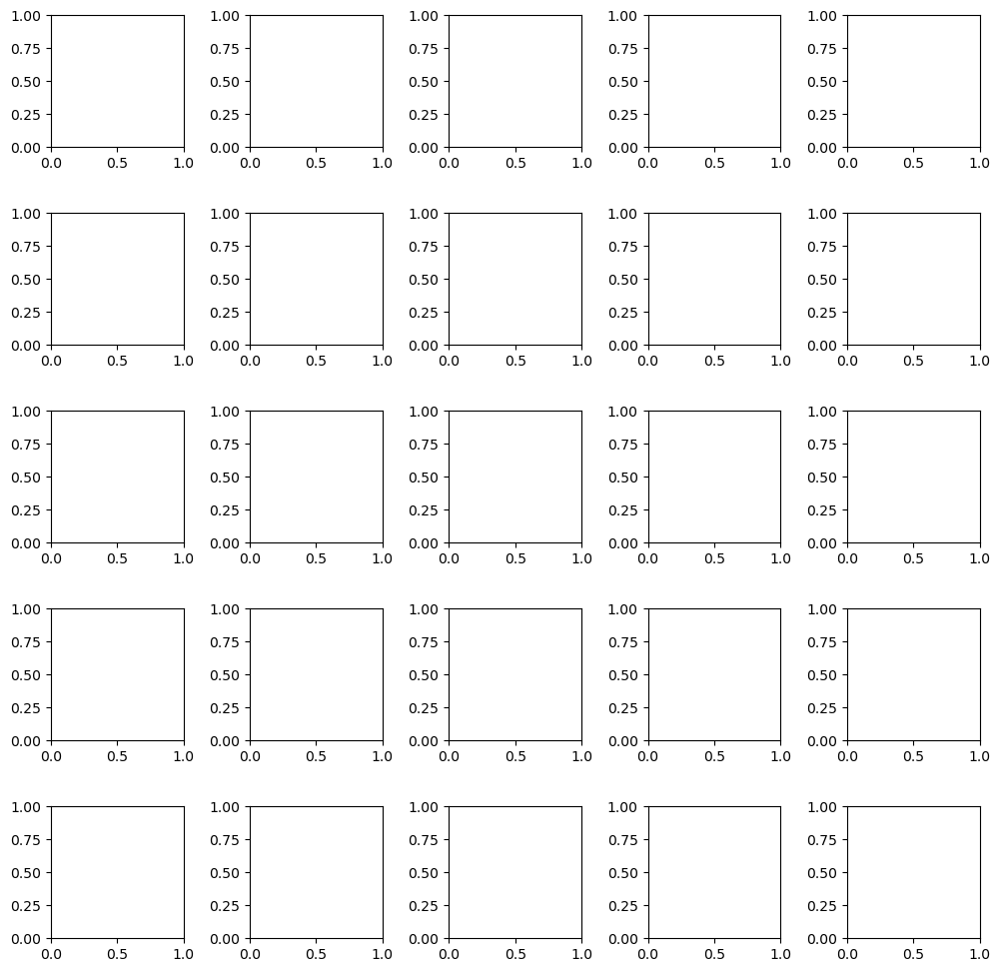

In [20]:
# Random & SGD stacking (meta_regressor = RD depth 2)
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import LogisticRegression
from mlxtend.regressor import StackingCVRegressor
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.activations import relu
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MAE
from sklearn.metrics import mean_absolute_error
import xgboost as xgb
import random 

seed = 42
tf.keras.utils.set_random_seed(seed)
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

f, axes = plt.subplots(5, 5)
# 격자 크기 설정
f.set_size_inches((12, 12))
# 격자 여백 설정
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)
baseline_MAE_list = list() 
baseline_NCLS_list = list()
MAE_list = list()
NCLS_list = list()
test_case_list = list()

for i in range(len(dataset)):
    # train dataset
    train_X = pd.DataFrame()
    train_y = np.array([[]])
    train = dataset[0:i] + dataset[i+1:len(dataset)]
    
    AE_X = train[0][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_lon', 'diff_lat']]
    train_X = train[0][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']]
    train_y = train[0][['diff_lon', 'diff_lat']]
    # 첫 행은 훈련에서 제외
    AE_X = AE_X[1:]
    train_X = train_X[1:]
    train_y = train_y[1:].to_numpy()
    
    for j in range(1,len(train)):
        add = train[j][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_lon', 'diff_lat']]
        trina_xi = train[j][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']] 
        trina_yi = train[j][['diff_lon', 'diff_lat']]
        add = add[1:]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        AE_X = pd.concat([AE_X,add],ignore_index = True)
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
        
    # 과거 데이터 훈련데이터에 추가
    for k in range(len(only_train_dataset)):
        add =  only_train_dataset[k][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_lon', 'diff_lat']]
        trina_xi = only_train_dataset[k][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']] 
        trina_yi = only_train_dataset[k][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        add = add[1:]
        
        AE_X = pd.concat([AE_X,add],ignore_index = True)
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
    
    # Test dataset
    test = dataset[i]
    start_lon = dataset[i]['start_lon'][0]
    start_lat = dataset[i]['start_lat'][0]
    test_X = test[['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']]
    test_X = test_X[1:]
    test_y = test[['diff_lon', 'diff_lat']]
    test_y = test_y[1:].to_numpy()
    
    
    latent_dim = 30
    AE_X = AE_X.to_numpy()
    autoencoder = Autoencoder(latent_dim)
    autoencoder.compile(optimizer='adam', loss='mse')
    autoencoder.fit(AE_X,AE_X,
                    epochs=150,
                    shuffle=True)
    encoded = autoencoder.encoder(AE_X).numpy()
    decoded = autoencoder.decoder(encoded).numpy()
    add_X = decoded[:,[0,1,2,3]]
    add_y = decoded[:,[4,5]]
    
    train_X = np.concatenate((train_X.to_numpy(),add_X), axis = 0)
    train_y = np.concatenate((train_y,add_y), axis = 0)
    
    # 행단위로 살펴보기
    test_case_df = dataset[i][['time', 'obs_x1_lon', 'obs_x1_lat', 'wind_y','wind_x','water_velocity_y','water_velocity_x','model_x2_lon', 'model_x2_lat']]
    test_case_df['rf_lon'] = start_lon
    test_case_df['rf_lat'] = start_lat
    test_case_df['ncls_model'] = 0
    test_case_df['ncls_rf'] = 0
    
    # RF, SGD 모델 생성
    xgboost_lon = xgb.XGBRegressor( learning_rate =0.01,
                                        n_estimators=1000,
                                        max_depth=5,
                                        min_child_weight=1,
                                        gamma=0,
                                        random_state =42)
    
    xgboost_lat = xgb.XGBRegressor( learning_rate =0.01,
                                        n_estimators=1000,
                                        max_depth=5,
                                        min_child_weight=1,
                                        gamma=0,
                                        random_state =42)
    lightgb_lon = lgb.LGBMRegressor(objective='regression',num_leaves=6,
                              learning_rate=0.009, n_estimators=300,max_depth=5)
    lightgb_lat = lgb.LGBMRegressor(objective='regression',num_leaves=6,
                              learning_rate=0.009, n_estimators=300,max_depth=5)
    
    # stacking
    stack_lon = StackingCVRegressor(regressors=(lightgb_lon), 
                                    meta_regressor=lightgb_lon,
                                   random_state = 42)
    
    stack_lat = StackingCVRegressor(regressors=( lightgb_lat),
                                    meta_regressor=lightgb_lat,
                                   random_state = 42)
    # fit
    stack_lon.fit(train_X, train_y[:,0])
    stack_lat.fit(train_X, train_y[:,1])
    
    # predict
    y_pred_lon = stack_lon.predict(test_X)
    y_pred_lon = y_pred_lon.reshape((y_pred_lon.shape[0],1))
    y_pred_lat = stack_lat.predict(test_X)
    y_pred_lat = y_pred_lat.reshape((y_pred_lat.shape[0],1))
    y_pred = np.concatenate((y_pred_lon, y_pred_lat),axis=1)

    
    # case 별로 이상행 탐색
    for k in range(1,len(test_case_df)-1):
        test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
        test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
        test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
        test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
    
    test_case_df['rf_diff_lon'] = test_case_df['rf_lon'].diff()
    test_case_df['rf_diff_lon'][0] = 0
    test_case_df['rf_diff_lat'] = test_case_df['rf_lat'].diff()  
    test_case_df['rf_diff_lat'][0] = 0
    test_case_df['model_diff_lon'] = test_case_df['model_x2_lon'].diff() 
    test_case_df['model_diff_lon'][0] = 0
    test_case_df['model_diff_lat'] = test_case_df['model_x2_lat'].diff()
    test_case_df['model_diff_lat'][0] = 0
    test_case_list.append(test_case_df)
    
    # Plot
    lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred = drift_trajection_show(i,y_pred)
    row = i//5
    col = i%5
    axes[row][col].plot(lon, lat,'r-' ,baseline_lon, baseline_lat, 'g-', lon_pred, lat_pred, 'skyblue')   
    
    # evaluation 
    y = np.concatenate((lon.reshape((lon.shape[0],1)), lat.reshape((lat.shape[0],1))),axis = 1)
    pred = np.concatenate((lon_pred.reshape((lon_pred.shape[0],1)), lat_pred.reshape((lat_pred.shape[0],1))),axis =1)
    baseline_pred = np.concatenate((baseline_lon.reshape((baseline_lon.shape[0],1)), baseline_lat.reshape((baseline_lat.shape[0],1))),axis =1)
    
    #mae
    MAE_list.append(drift_mae(y, pred))
    baseline_MAE_list.append(drift_mae(y, baseline_pred))
    
    #NCLS
    NCLS_list.append(NCLS_score(y, pred))
    baseline_NCLS_list.append(NCLS_score(y, baseline_pred))
    
for i in range(len(MAE_list)):
    print('------------------------ Model ', i+1, '------------------------')
    print('baseline',str(i),' MAE : ',MAE_list[i])
    print('Model',str(i),' MAE : ', baseline_MAE_list[i])
    print('baseline',str(i),' NCLS : ',baseline_NCLS_list[i])
    print('Model',str(i),' NCLS : ', NCLS_list[i])

plt.show()

In [ ]:
# 데이터 2배 stacking 
mae_sum = 0
baseline_mae_sum = 0
NCLS_sum = 0
baseline_NCLS_sum = 0

for i in range(len(dataset)):
    mae_sum += MAE_list[i]
    baseline_mae_sum += baseline_MAE_list[i]
    NCLS_sum += NCLS_list[i]
    baseline_NCLS_sum += baseline_NCLS_list[i]

# 라이브러리 Mae    
print ('Model Mae : ', mae_sum/len(dataset) )
print ('Baseline Mae : ', baseline_mae_sum/len(dataset) )
print ('Model NCLS : ', NCLS_sum/len(dataset) )
print ('Baseline NCLS : ', baseline_NCLS_sum/len(dataset) )